In [3]:
# !pip install segmentation-models-pytorch

In [13]:
# from google.colab import drive
# drive.mount("/content/drive")

In [1]:
import os
import numpy
import json
import matplotlib.pyplot as plt
import cv2
import random
import segmentation_models_pytorch
import torchvision
import torch
import PIL
import skimage
import shapely
import openpyxl
import time
import shutil
import gc
gc.collect()

0

In [2]:
os.chdir(r"D:\Files\Data Science\Self projects\Classification projects\Brain tumor- Semantic segmentation")

In [3]:
with open(file= os.path.join(os.getcwd(), "train_annotations.json"), mode= "r") as file:
    train_data = json.load(fp= file)
with open(file= os.path.join(os.getcwd(), "test_annotations.json"), mode= "r") as file:
    test_data = json.load(fp= file)
with open(file= os.path.join(os.getcwd(), "validation_annotations.json"), mode= "r") as file:
    validation_data = json.load(fp= file)

(640, 640, 3)


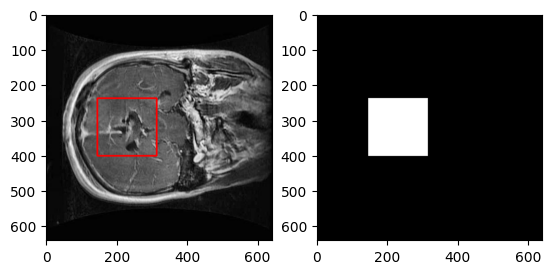

In [4]:
i= 0
if train_data["images"][i]["id"] == train_data["annotations"][i]["id"]:
    image= cv2.imread(os.path.join(os.getcwd(), "train_images", train_data["images"][i]["file_name"]))
    image= cv2.resize(src= image, dsize= (train_data["images"][i]["width"], train_data["images"][i]["height"]))
    print(image.shape)
    segmentation_points= train_data["annotations"][i]["segmentation"][0]
    segmentation_coordinates= numpy.array(object= segmentation_points, dtype= numpy.int32)
    segmentation_coordinates= segmentation_coordinates.reshape((-1, 1, 2))
    cv2.polylines(img= image, pts= [segmentation_coordinates], isClosed= True, color= (255, 0, 0), thickness= 3)
    plt.subplot(1, 2, 1)
    plt.imshow(image)

    mask_image= numpy.zeros(shape= (train_data["images"][i]["height"], train_data["images"][i]["width"]), dtype= numpy.uint8)
    cv2.drawContours(image= mask_image, contours= [segmentation_coordinates], contourIdx= -1, color= (255, 255, 255), thickness= cv2.FILLED)
    mask_image= cv2.cvtColor(src= mask_image, code= cv2.COLOR_RGB2BGR)
    # cv2.imwrite(filename= os.path.join(os.getcwd(), "train_masks", train_data["images"][i]["file_name"]), img= mask_image)
    plt.subplot(1, 2, 2)
    plt.imshow(mask_image)
    plt.show()

In [ ]:
# # Creating train masks
# for i in range(len(train_data["images"])):
#     if train_data["images"][i]["id"] == train_data["annotations"][i]["id"]:
#         segmentation_points= train_data["annotations"][i]["segmentation"][0]
#         segmentation_coordinates= numpy.array(object= segmentation_points, dtype= numpy.int32)
#         segmentation_coordinates= segmentation_coordinates.reshape((-1, 1, 2))
#         mask_image= numpy.zeros(shape= (train_data["images"][i]["height"], train_data["images"][i]["width"]), dtype= numpy.uint8)
#         cv2.drawContours(image= mask_image, contours= [segmentation_coordinates], contourIdx= -1, color= (255, 255, 255), thickness= cv2.FILLED)
#         cv2.imwrite(filename= os.path.join(os.getcwd(), "train_masks", train_data["images"][i]["file_name"]), img= mask_image)
#     else:
#         print(i)

In [ ]:
# # Creating test masks
# for i in range(len(test_data["images"])):
#     if test_data["images"][i]["id"] == test_data["annotations"][i]["id"]:
#         segmentation_points= test_data["annotations"][i]["segmentation"][0]
#         segmentation_coordinates= numpy.array(object= segmentation_points, dtype= numpy.int32)
#         segmentation_coordinates= segmentation_coordinates.reshape((-1, 1, 2))
#         mask_image= numpy.zeros(shape= (test_data["images"][i]["height"], test_data["images"][i]["width"]), dtype= numpy.uint8)
#         cv2.drawContours(image= mask_image, contours= [segmentation_coordinates], contourIdx= -1, color= (255, 255, 255), thickness= cv2.FILLED)
#         cv2.imwrite(filename= os.path.join(os.getcwd(), "test_masks", test_data["images"][i]["file_name"]), img= mask_image)
#     else:
#         print(i)

In [ ]:
# # Creating validation masks
# for i in range(len(validation_data["images"])):
#     if validation_data["images"][i]["id"] == validation_data["annotations"][i]["id"]:
#         segmentation_points= validation_data["annotations"][i]["segmentation"][0]
#         segmentation_coordinates= numpy.array(object= segmentation_points, dtype= numpy.int32)
#         segmentation_coordinates= segmentation_coordinates.reshape((-1, 1, 2))
#         mask_image= numpy.zeros(shape= (validation_data["images"][i]["height"], validation_data["images"][i]["width"]), dtype= numpy.uint8)
#         cv2.drawContours(image= mask_image, contours= [segmentation_coordinates], contourIdx= -1, color= (255, 255, 255), thickness= cv2.FILLED)
#         cv2.imwrite(filename= os.path.join(os.getcwd(), "validation_masks", validation_data["images"][i]["file_name"]), img= mask_image)
#     else:
#         print(i)

In [5]:
class CustomDataset_general(torch.utils.data.Dataset):
    def __init__(self, image_folder, mask_folder, transform=None):
        self.image_folder = image_folder
        self.mask_folder = mask_folder
        self.image_files = sorted(os.listdir(self.image_folder))
        self.mask_files = sorted(os.listdir(self.mask_folder))
        self.transform = transform
    def __len__(self):
        return len(self.image_files)
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.image_folder, img_name)
        image = PIL.Image.open(img_path).convert("RGB")
        image_gray = image.convert("L")
        mask_name = self.mask_files[idx]
        mask_path = os.path.join(self.mask_folder, mask_name)
        mask = PIL.Image.open(mask_path).convert("L")
        if self.transform:
            image_gray = self.transform(image_gray)
            mask = self.transform(mask)
        return image_gray, mask

image_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((256, 256)),
    torchvision.transforms.ToTensor(),
    # torchvision.transforms.Normalize(mean=[0.485], std=[0.229]),
    # torchvision.transforms.Lambda(lambda x: x.clamp(0, 1))
])
train_dataset = CustomDataset_general(os.path.join(os.getcwd(), "train_images"), os.path.join(os.getcwd(), "train_masks"), transform= image_transform)
test_dataset = CustomDataset_general(os.path.join(os.getcwd(), "test_images"), os.path.join(os.getcwd(), "test_masks"), transform= image_transform)
batch_size= 1
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size= 1, shuffle= True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size= 1, shuffle= True)

In [7]:
len(train_loader), len(test_loader)

(1824, 322)

In [8]:
def calculate_iou(y_true, y_pred):      # Intersection over Union score, ranging from 0 (no overlap) to 1 (perfect overlap).
    intersection = numpy.logical_and(y_true, y_pred).sum()
    union = numpy.logical_or(y_true, y_pred).sum()
    iou = intersection / union if union > 0 else 0
    return iou
def calculate_dice_coefficient(y_true, y_pred):
    intersection = numpy.sum(y_true * y_pred)
    dice_coeff = (2. * intersection) / (numpy.sum(y_true) + numpy.sum(y_pred))
    return dice_coeff
def calculate_pixel_accuracy(y_true, y_pred):        # Pixel accuracy measures the proportion of correctly predicted pixels.
    correct_pixels = numpy.sum(y_true == y_pred)
    total_pixels = y_true.size
    pixel_accuracy_score = correct_pixels / total_pixels
    return round(pixel_accuracy_score, 4)

In [9]:
device= "cuda" if torch.cuda.is_available() else "cpu"
print("Device is :", device)

Device is : cpu


In [20]:
def train_model(model):
    t1= time.time()
    model= model.to(device)
    loss_function= torch.nn.BCEWithLogitsLoss()
    optimizer= torch.optim.Adam(params= model.parameters(), lr= 0.0001)
    num_epochs= 10
    for n in range(num_epochs):
        model.train()
        total_loss= 0
        total_pixel_accuracy_score= 0
        total_step_accuracy= 0
        for i ,(image, mask) in enumerate(iterable= train_loader, start= 0):
            image  = image.to(device)
            mask = mask.to(device)
            optimizer.zero_grad()
            prediction = model(image)
            loss = loss_function(prediction , mask)
            total_loss += loss.item()
            num_correct= (torch.argmax(input= prediction, dim=1)== mask).type(torch.float).sum().item()
            step_accuracy = (num_correct/ mask.detach().numpy().size)
            total_step_accuracy += step_accuracy
            loss.backward()
            optimizer.step()
            threshold= 0.5  # Adjust as necessary based on your model's output
            prediction_= (prediction.detach().numpy() > threshold).astype(numpy.uint8)
            pixel_accuracy_score= calculate_pixel_accuracy(mask.detach().numpy().reshape((256, 256, 1)), prediction_.reshape((256, 256, 1)))
            total_pixel_accuracy_score += pixel_accuracy_score
            print(f"Epoch [{n+ 1}/{num_epochs}], Step [{i+1}/ {len(train_loader)}], Loss: {loss.item():.4f}, pixel accuracy score : {pixel_accuracy_score:.4f}, step accuracy score : {step_accuracy:.4f}")
        print(f"\nEpoch : {n+ 1}, average loss : {(total_loss/ len(train_loader)):.4f}, average step accuracy : {(total_step_accuracy/ len(train_loader)):.4f}, average pixel accuracy score : {(total_pixel_accuracy_score/ len(train_loader)):.4f}")
        print("-------------------------------------------------------------------------------------------------------------------------------------------")
    t2= time.time()
    print("Time taken is :", round((t2- t1)/ 60, 3), "minutes.")
    return None

In [13]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [21]:
model= segmentation_models_pytorch.Unet(encoder_name= "resnet50", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "resnet50.h5"))
del model
gc.collect()

Epoch [1/10], Step [1/ 1824], Loss: 1.1569, pixel accuracy score : 0.4289, step accuracy score : 0.9889
Epoch [1/10], Step [2/ 1824], Loss: 1.1474, pixel accuracy score : 0.4298, step accuracy score : 0.9866
Epoch [1/10], Step [3/ 1824], Loss: 1.1335, pixel accuracy score : 0.4382, step accuracy score : 0.9834
Epoch [1/10], Step [4/ 1824], Loss: 1.0855, pixel accuracy score : 0.4616, step accuracy score : 0.9333
Epoch [1/10], Step [5/ 1824], Loss: 1.0939, pixel accuracy score : 0.4762, step accuracy score : 0.9634
Epoch [1/10], Step [6/ 1824], Loss: 1.0148, pixel accuracy score : 0.5498, step accuracy score : 0.9459
Epoch [1/10], Step [7/ 1824], Loss: 1.0610, pixel accuracy score : 0.5246, step accuracy score : 0.9647
Epoch [1/10], Step [8/ 1824], Loss: 0.9609, pixel accuracy score : 0.6358, step accuracy score : 0.9318
Epoch [1/10], Step [9/ 1824], Loss: 1.0062, pixel accuracy score : 0.5938, step accuracy score : 0.9325
Epoch [1/10], Step [10/ 1824], Loss: 0.9905, pixel accuracy scor

0

In [22]:
model= segmentation_models_pytorch.Unet(encoder_name= "densenet201", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "densenet201.h5"))
del model
gc.collect()

Epoch [1/10], Step [1/ 1824], Loss: 0.9566, pixel accuracy score : 0.5575, step accuracy score : 0.9807
Epoch [1/10], Step [2/ 1824], Loss: 0.9474, pixel accuracy score : 0.5717, step accuracy score : 0.9889
Epoch [1/10], Step [3/ 1824], Loss: 0.9147, pixel accuracy score : 0.5794, step accuracy score : 0.9359
Epoch [1/10], Step [4/ 1824], Loss: 0.9350, pixel accuracy score : 0.5898, step accuracy score : 0.9873
Epoch [1/10], Step [5/ 1824], Loss: 0.9182, pixel accuracy score : 0.6038, step accuracy score : 0.9761
Epoch [1/10], Step [6/ 1824], Loss: 0.8636, pixel accuracy score : 0.6392, step accuracy score : 0.9162
Epoch [1/10], Step [7/ 1824], Loss: 0.8855, pixel accuracy score : 0.6532, step accuracy score : 0.9595
Epoch [1/10], Step [8/ 1824], Loss: 0.8846, pixel accuracy score : 0.6468, step accuracy score : 0.9623
Epoch [1/10], Step [9/ 1824], Loss: 0.8672, pixel accuracy score : 0.6907, step accuracy score : 0.9684
Epoch [1/10], Step [10/ 1824], Loss: 0.8555, pixel accuracy scor

8

In [ ]:
model= segmentation_models_pytorch.Unet(encoder_name= "inceptionv4", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "inceptionv4.h5"))
del model
gc.collect()

Epoch [1/10], Step [1/ 1824], Loss: 0.5138, pixel accuracy score : 0.8961, step accuracy score : 0.9297
Epoch [1/10], Step [2/ 1824], Loss: 0.4300, pixel accuracy score : 0.9380, step accuracy score : 0.9799
Epoch [1/10], Step [3/ 1824], Loss: 0.4299, pixel accuracy score : 0.9393, step accuracy score : 0.9773
Epoch [1/10], Step [4/ 1824], Loss: 0.4214, pixel accuracy score : 0.9477, step accuracy score : 0.9882
Epoch [1/10], Step [5/ 1824], Loss: 0.4281, pixel accuracy score : 0.9438, step accuracy score : 0.9748
Epoch [1/10], Step [6/ 1824], Loss: 0.4081, pixel accuracy score : 0.9442, step accuracy score : 0.9720
Epoch [1/10], Step [7/ 1824], Loss: 0.4057, pixel accuracy score : 0.9469, step accuracy score : 0.9741
Epoch [1/10], Step [8/ 1824], Loss: 0.4085, pixel accuracy score : 0.9464, step accuracy score : 0.9748
Epoch [1/10], Step [9/ 1824], Loss: 0.3928, pixel accuracy score : 0.9339, step accuracy score : 0.9538
Epoch [1/10], Step [10/ 1824], Loss: 0.3750, pixel accuracy scor

In [ ]:
model= segmentation_models_pytorch.Unet(encoder_name= "xception", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "xception.h5"))
del model
gc.collect()

In [ ]:
model= segmentation_models_pytorch.Unet(encoder_name= "efficientnet-b4", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "efficientnet-b4.h5"))
del model
gc.collect()

In [ ]:
model= segmentation_models_pytorch.Unet(encoder_name= "timm-mobilenetv3_large_100", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "timm-mobilenetv3_large_100.h5"))
del model
gc.collect()

In [ ]:
model= segmentation_models_pytorch.Unet(encoder_name= "vgg19", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "vgg19.h5"))
del model
gc.collect()

In [ ]:
model= segmentation_models_pytorch.Unet(encoder_name= "vgg16", encoder_weights= "imagenet", in_channels= 1, classes= 1, activation= None)
train_model(model)
torch.save(obj= model, f= os.path.join(os.getcwd(), "Saved models", "vgg16.h5"))
del model
gc.collect()

In [16]:
# device= "cuda" if torch.cuda.is_available() else "cpu"
# model= torch.load(f= os.path.join(os.getcwd(), "Saved models", "resnet50.h5"), map_location= torch.device(device))

In [19]:
# Function to load and preprocess an image
def predict_binary_mask(image_path):
    image = PIL.Image.open(image_path).convert("RGB")
    image = image.convert("L")
    transform = torchvision.transforms.Compose([
        torchvision.transforms.Resize((256, 256)),  # Resize images (same as during training)
        torchvision.transforms.ToTensor()           # Convert PIL images to tensors
    ])
    image = transform(image)
    image_tensor = image.unsqueeze(0)  # Add batch dimension
    # Set model to evaluation mode
    model.eval()
    # Make predictions
    with torch.no_grad():
        outputs = model(image_tensor)
        predicted_masks = torch.sigmoid(outputs)  # Apply sigmoid if using BCEWithLogitsLoss
    # Convert predicted_masks to numpy array
    predicted_masks_np = predicted_masks.squeeze(0).cpu().numpy()
    # Threshold predicted_masks to obtain binary masks
    threshold = 0.5  # Adjust as necessary based on your model's output
    predicted_binary_masks = (predicted_masks_np > threshold).astype(numpy.uint8)
    predicted_binary_masks= predicted_binary_masks.reshape((256, 256))
    return predicted_binary_masks

img= "27_jpg.rf.b2a2b9811786cc32a23c46c560f04d07.jpg"
image_path= os.path.join(os.getcwd(), "test_images", img)
predicted_binary_masks= predict_binary_mask(image_path)

In [20]:
mask_image= cv2.imread(filename= os.path.join(os.getcwd(), "test_masks", img))
mask_image= cv2.resize(src= mask_image, dsize= (256, 256))
mask_image= cv2.cvtColor(src= mask_image, code= cv2.COLOR_RGB2GRAY)
calculate_pixel_accuracy(mask_image, predicted_binary_masks)

0.9818

In [21]:
# Label connected regions
labelled_masks, num_labels= skimage.measure.label(label_image= predicted_binary_masks, background= None, return_num= True, connectivity= None)
# Get bounding boxes for each labeled region
mask_coordinates = []
for region in skimage.measure.regionprops(label_image= labelled_masks):
    minr, minc, maxr, maxc= region.bbox
    mask_coordinates.append((minc, minr, maxc, maxr))  # (x_min, y_min, x_max, y_max)
print("Predicted Mask Coordinates (Bounding Boxes) :", mask_coordinates)

Predicted Mask Coordinates (Bounding Boxes) : [(61, 85, 90, 118)]


Number of predicted mask coordinates (Polygon Vertices) : 125


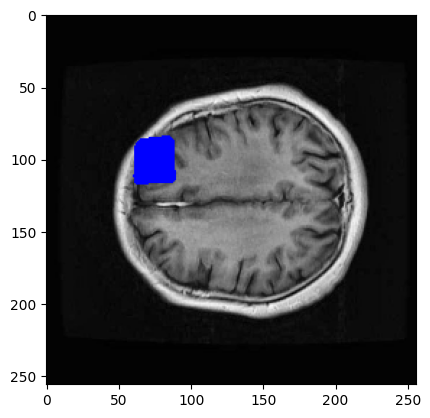

In [22]:
# Find contours in the binary masks
# contours= skimage.measure.find_contours(image= predicted_binary_masks, level= 0.5, fully_connected= 'high')
contours= skimage.measure.find_contours(image= predicted_binary_masks, level= None, fully_connected= "low", positive_orientation= "low", mask= None)
# Convert contours to polygon vertices
polygon_vertices_list = []
for contour in contours:
    contour = numpy.flip(contour, axis= 1)  # Convert (row, col) to (x, y)
    polygon_vertices_list.extend(contour.tolist())
print("Number of predicted mask coordinates (Polygon Vertices) :", len(polygon_vertices_list))
polygon_vertices= [[int(element[0]), int(element[1])] for element in polygon_vertices_list]
polygon_vertices= numpy.array(polygon_vertices).reshape((-1, 1, 2))
# mask_image= numpy.zeros(shape= (256, 256), dtype= numpy.uint8)
image= cv2.imread(filename= image_path)
image= cv2.resize(src= image, dsize= (256, 256))
cv2.drawContours(image= image, contours= [polygon_vertices], contourIdx= -1, color= (255, 0, 0), thickness= cv2.FILLED)
image= cv2.cvtColor(src= image, code= cv2.COLOR_RGB2BGR)
plt.imshow(image)
plt.show()

In [30]:
shutil.rmtree(path= os.path.join(os.getcwd(), "predicted_masks"))
os.mkdir(path= os.path.join(os.getcwd(), "predicted_masks"))

Number of predicted mask coordinates (Polygon Vertices) in image 1001_jpg.rf.a64df329f81626672c9b81f95d421c84.jpg are : 123
Pixel accuracy score is : 0.9826
Area of image is : 65536 units and area of predicted mask is : 770.5 units.


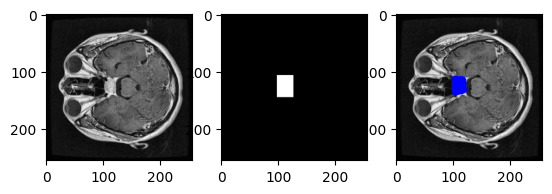

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1006_jpg.rf.9e260b2c3d87e68b706022359921b4e0.jpg are : 133
Pixel accuracy score is : 0.9816
Area of image is : 65536 units and area of predicted mask is : 934.5 units.


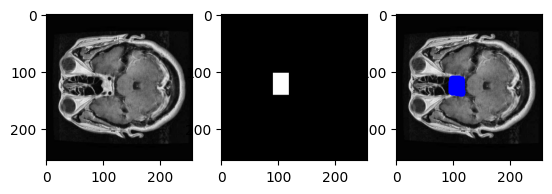

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1007_jpg.rf.bf4640f845748bd0c7fe976a3c5e521e.jpg are : 133
Pixel accuracy score is : 0.9837
Area of image is : 65536 units and area of predicted mask is : 972.5 units.


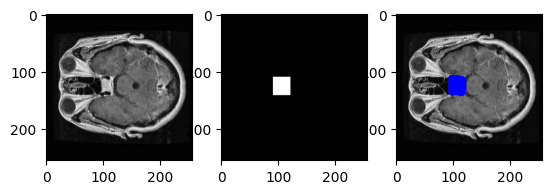

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1009_jpg.rf.230f70b84d8d461b7c40b7ce30cd0ced.jpg are : 111
Pixel accuracy score is : 0.9878
Area of image is : 65536 units and area of predicted mask is : 694.5 units.


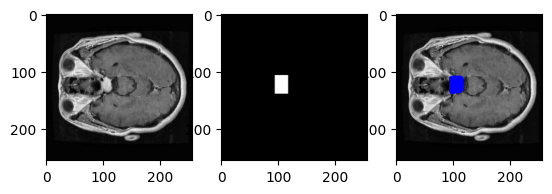

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1017_jpg.rf.ba655f08ad043a07dae9f78742eec55f.jpg are : 129
Pixel accuracy score is : 0.9851
Area of image is : 65536 units and area of predicted mask is : 868.5 units.


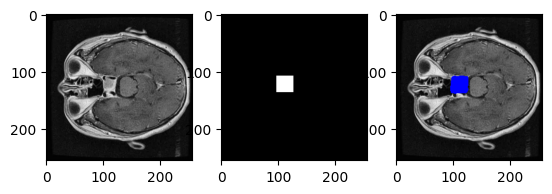

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1018_jpg.rf.5c6fcb4480745ff7c60c7305781913ab.jpg are : 139
Pixel accuracy score is : 0.9817
Area of image is : 65536 units and area of predicted mask is : 1069.5 units.


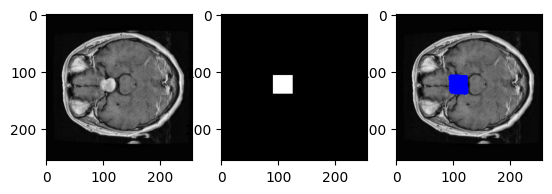

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 101_jpg.rf.dd907ecf624e1196175798df5964b1a3.jpg are : 27
Pixel accuracy score is : 0.9703
Area of image is : 65536 units and area of predicted mask is : 29.5 units.


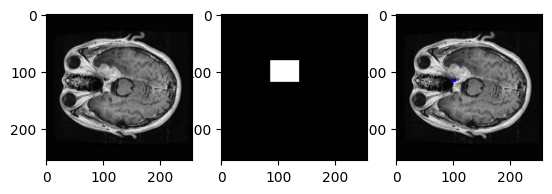

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1021_jpg.rf.34fe547013212c61c66de1b397955892.jpg are : 195
Pixel accuracy score is : 0.9666
Area of image is : 65536 units and area of predicted mask is : 2029.5 units.


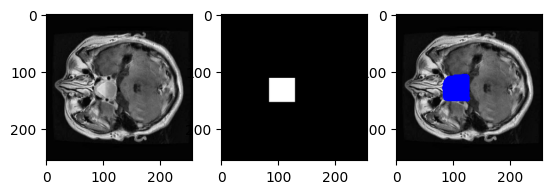

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1022_jpg.rf.e2638d7fdbcf091895e1c4c91377ac55.jpg are : 195
Pixel accuracy score is : 0.965
Area of image is : 65536 units and area of predicted mask is : 2077.5 units.


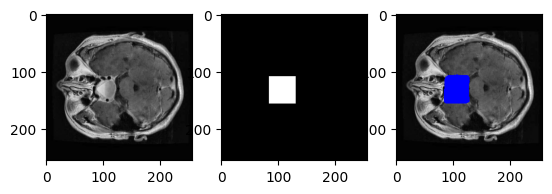

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1023_jpg.rf.4dd95a6ac478364851bcefb7dd9b560c.jpg are : 187
Pixel accuracy score is : 0.9735
Area of image is : 65536 units and area of predicted mask is : 914.5 units.


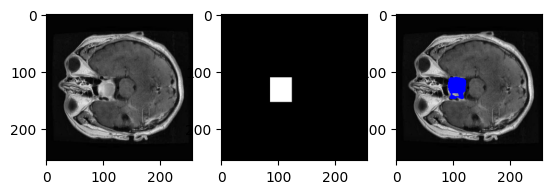

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1024_jpg.rf.3f0d08c1ca6211c2425ca40c06dee0e6.jpg are : 145
Pixel accuracy score is : 0.981
Area of image is : 65536 units and area of predicted mask is : 1184.5 units.


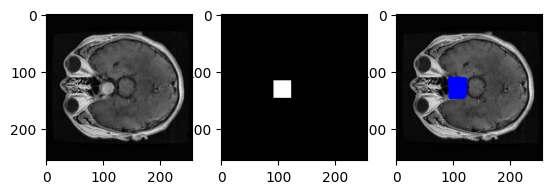

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1033_jpg.rf.14dba775161e038fbf1ea1ee99a16bf2.jpg are : 159
Pixel accuracy score is : 0.9788
Area of image is : 65536 units and area of predicted mask is : 1185.5 units.


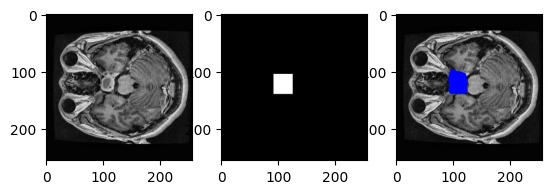

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1035_jpg.rf.0dead1ccbe6b1e137ca2d98fc4d34b9a.jpg are : 179
Pixel accuracy score is : 0.9715
Area of image is : 65536 units and area of predicted mask is : 1608.5 units.


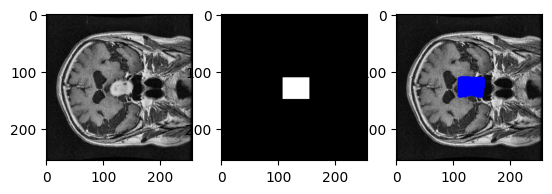

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1036_jpg.rf.3819c66b67056c99ea19aec0d9e703d3.jpg are : 199
Pixel accuracy score is : 0.9641
Area of image is : 65536 units and area of predicted mask is : 1403.5 units.


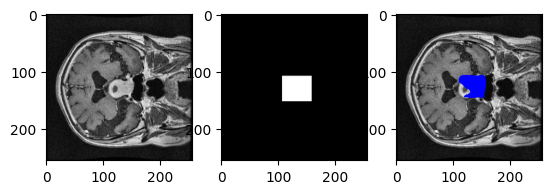

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1041_jpg.rf.ce5158e122144448e84f90197c97f963.jpg are : 145
Pixel accuracy score is : 0.9869
Area of image is : 65536 units and area of predicted mask is : 4.5 units.


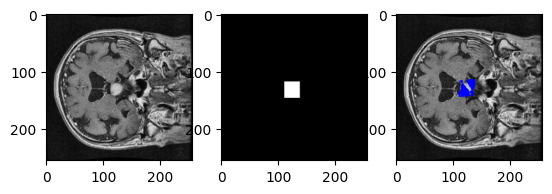

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1045_jpg.rf.1f59bdc2ecb73fda52446ac8f7fa4a30.jpg are : 169
Pixel accuracy score is : 0.9706
Area of image is : 65536 units and area of predicted mask is : 1398.5 units.


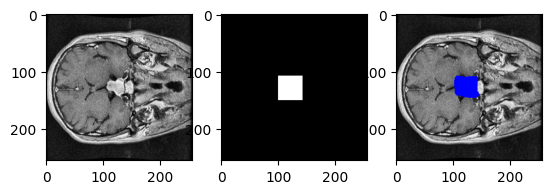

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1048_jpg.rf.b7dc057c1351162a7e6f1ded8d24fcd7.jpg are : 207
Pixel accuracy score is : 0.9621
Area of image is : 65536 units and area of predicted mask is : 2206.5 units.


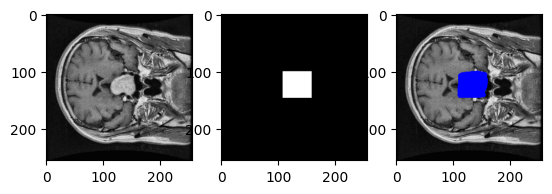

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1051_jpg.rf.238b210b55366c25aadf643325c5edc1.jpg are : 229
Pixel accuracy score is : 0.9501
Area of image is : 65536 units and area of predicted mask is : 2885.5 units.


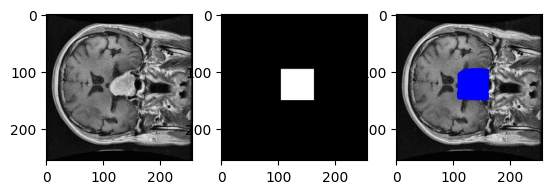

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1052_jpg.rf.959177d0e4941084149052a22b68028f.jpg are : 203
Pixel accuracy score is : 0.9522
Area of image is : 65536 units and area of predicted mask is : 2196.5 units.


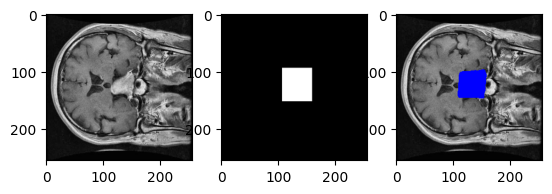

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1056_jpg.rf.f539615badbea313d68c957e76642dda.jpg are : 163
Pixel accuracy score is : 0.966
Area of image is : 65536 units and area of predicted mask is : 1405.5 units.


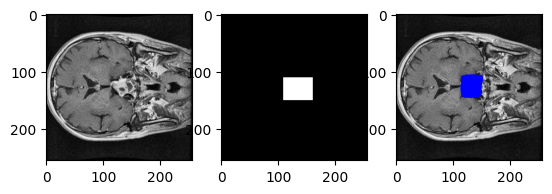

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1057_jpg.rf.7a3fafa6650cf6119ddd0e8577f0908b.jpg are : 177
Pixel accuracy score is : 0.9655
Area of image is : 65536 units and area of predicted mask is : 1525.5 units.


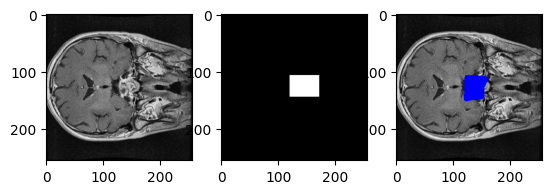

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1061_jpg.rf.7d073337e5195c9fc2f08ff4e7e55698.jpg are : 125
Pixel accuracy score is : 0.9723
Area of image is : 65536 units and area of predicted mask is : 745.5 units.


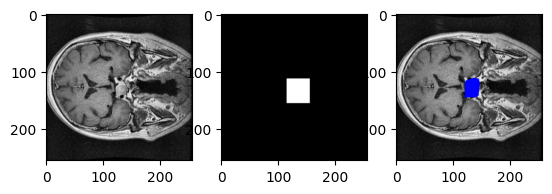

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1071_jpg.rf.b2da75f1dd344155097c6e6d987f458e.jpg are : 117
Pixel accuracy score is : 0.9852
Area of image is : 65536 units and area of predicted mask is : 710.5 units.


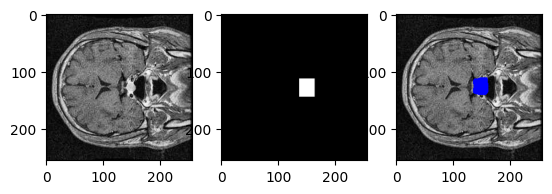

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1072_jpg.rf.45310adc3a3055067e841021aa27fd36.jpg are : 97
Pixel accuracy score is : 0.9843
Area of image is : 65536 units and area of predicted mask is : 471.5 units.


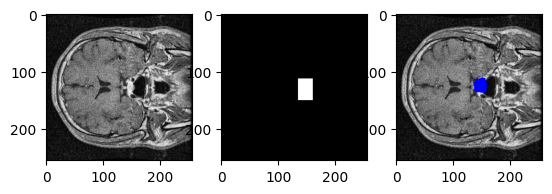

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1083_jpg.rf.b1473a76f8f3789c6be693dfbe9bc011.jpg are : 17
Pixel accuracy score is : 0.9855
Area of image is : 65536 units and area of predicted mask is : 9.5 units.


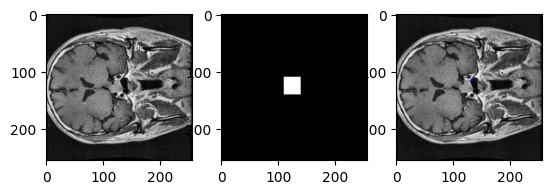

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1097_jpg.rf.df6c35b4ed24ef8c28138939567ef7ab.jpg are : 17
Pixel accuracy score is : 0.983
Area of image is : 65536 units and area of predicted mask is : 13.5 units.


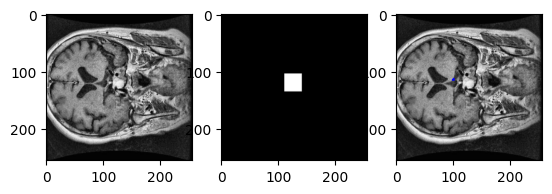

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1119_jpg.rf.1a91f0a1d05cd3ade30b5c0ed9185020.jpg are : 162
Pixel accuracy score is : 0.9776
Area of image is : 65536 units and area of predicted mask is : 1311.0 units.


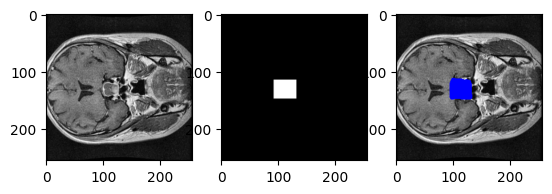

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1122_jpg.rf.040e9ae0991da8d5e7668c8c6637cc78.jpg are : 155
Pixel accuracy score is : 0.9787
Area of image is : 65536 units and area of predicted mask is : 1290.5 units.


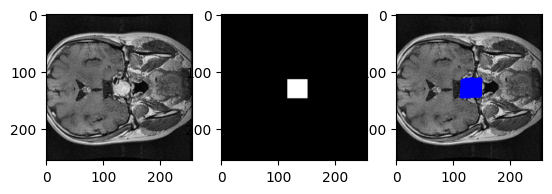

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1125_jpg.rf.6a2f54deeac86ff2d961132a828c9ae6.jpg are : 165
Pixel accuracy score is : 0.9698
Area of image is : 65536 units and area of predicted mask is : 1492.5 units.


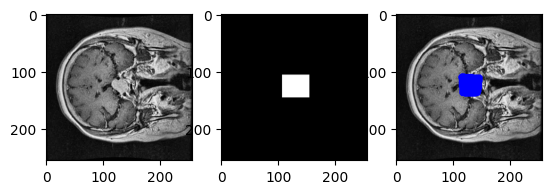

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1126_jpg.rf.d216bd33f5b8f7f557d14928c232a377.jpg are : 167
Pixel accuracy score is : 0.9725
Area of image is : 65536 units and area of predicted mask is : 1538.5 units.


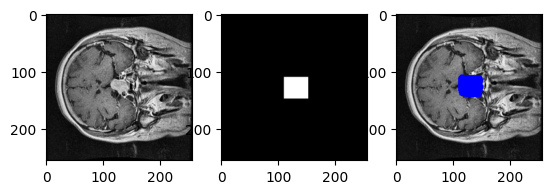

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1130_jpg.rf.d1672624856f1df581acc128aea4a635.jpg are : 163
Pixel accuracy score is : 0.9628
Area of image is : 65536 units and area of predicted mask is : 1330.5 units.


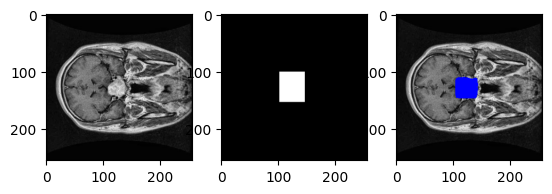

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1136_jpg.rf.02df64849485272e48139498c36c8e44.jpg are : 153
Pixel accuracy score is : 0.978
Area of image is : 65536 units and area of predicted mask is : 1265.5 units.


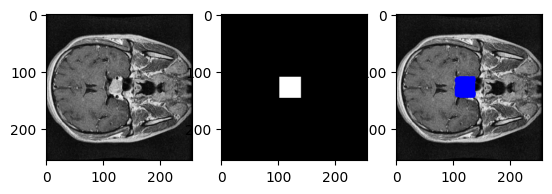

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1140_jpg.rf.f8a48ff0879568ff23cd511711ef650e.jpg are : 65
Pixel accuracy score is : 0.9863
Area of image is : 65536 units and area of predicted mask is : 157.5 units.


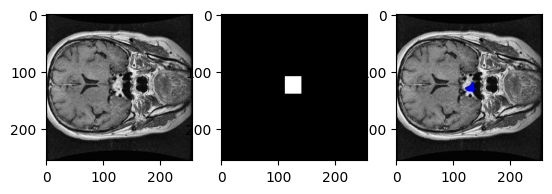

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1142_jpg.rf.4b007ebc0d6dca97d351d5b49c175471.jpg are : 99
Pixel accuracy score is : 0.9874
Area of image is : 65536 units and area of predicted mask is : 438.5 units.


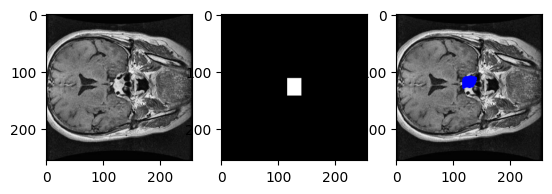

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1156_jpg.rf.750dbf06c7b0017a648125a55e23e9b5.jpg are : 133
Pixel accuracy score is : 0.9837
Area of image is : 65536 units and area of predicted mask is : 876.5 units.


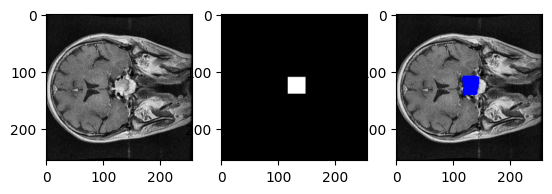

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 116_jpg.rf.a3997fa73624f3045e23deadb5f113ec.jpg are : 257
Pixel accuracy score is : 0.9504
Area of image is : 65536 units and area of predicted mask is : 3252.5 units.


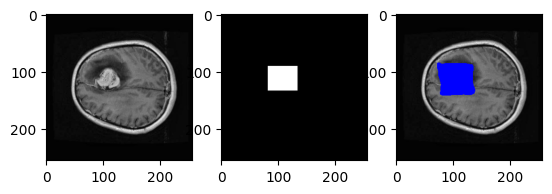

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1170_jpg.rf.02e9c4b8a1c169547cbf359ece1e4d8e.jpg are : 197
Pixel accuracy score is : 0.9655
Area of image is : 65536 units and area of predicted mask is : 2182.5 units.


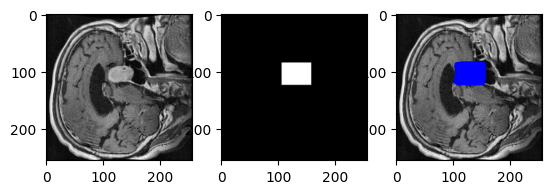

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1174_jpg.rf.336d0729fe53adf926746fe2fe9cd0df.jpg are : 189
Pixel accuracy score is : 0.9657
Area of image is : 65536 units and area of predicted mask is : 2031.5 units.


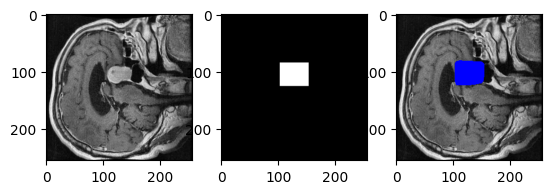

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1177_jpg.rf.b17dba5ed401c80e8df0c35a01e6dab1.jpg are : 157
Pixel accuracy score is : 0.9785
Area of image is : 65536 units and area of predicted mask is : 1366.5 units.


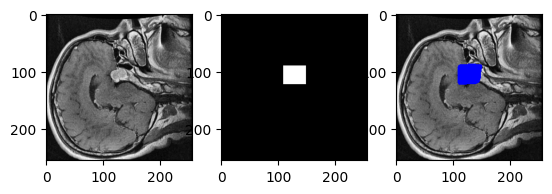

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 117_jpg.rf.7d291e1e873dd34f36663ee9056c583a.jpg are : 319
Pixel accuracy score is : 0.9256
Area of image is : 65536 units and area of predicted mask is : 4928.5 units.


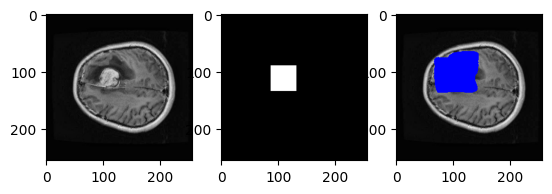

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1184_jpg.rf.cebd487c300cd06f123f01296719cd8c.jpg are : 191
Pixel accuracy score is : 0.9591
Area of image is : 65536 units and area of predicted mask is : 1450.5 units.


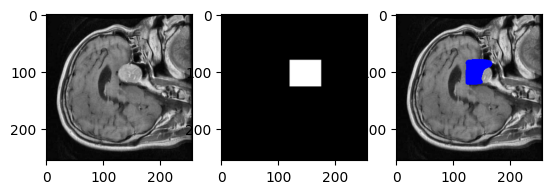

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 118_jpg.rf.886b20780bd9ce055e4dd7cd9cbbd19c.jpg are : 218
Pixel accuracy score is : 0.9684
Area of image is : 65536 units and area of predicted mask is : 2080.0 units.


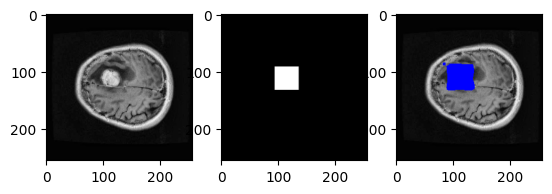

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1193_jpg.rf.ab22abd70db8cc368f5baf75728b5a5e.jpg are : 141
Pixel accuracy score is : 0.9753
Area of image is : 65536 units and area of predicted mask is : 1107.5 units.


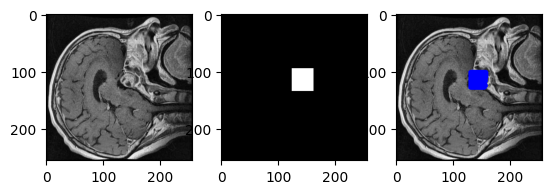

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1198_jpg.rf.23baa1a977b7581326b0d7758f2dcc88.jpg are : 67
Pixel accuracy score is : 0.9918
Area of image is : 65536 units and area of predicted mask is : 144.5 units.


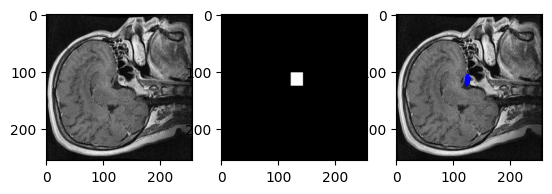

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1209_jpg.rf.e4323403c999a44e8c47683ce6a9070e.jpg are : 199
Pixel accuracy score is : 0.9687
Area of image is : 65536 units and area of predicted mask is : 1889.5 units.


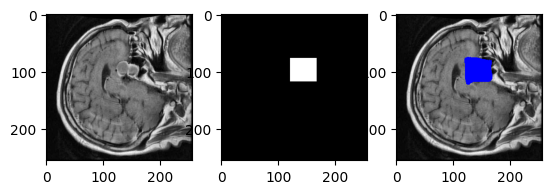

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1210_jpg.rf.9fcd87cdaed4cce5ba9495bf6a84eec0.jpg are : 199
Pixel accuracy score is : 0.9618
Area of image is : 65536 units and area of predicted mask is : 2144.5 units.


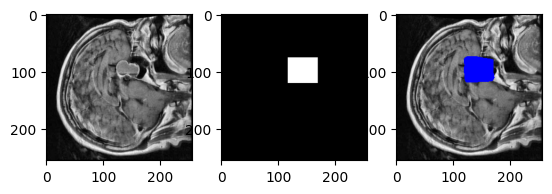

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1213_jpg.rf.fa427f58248b8291d8c8188873c2d35b.jpg are : 137
Pixel accuracy score is : 0.9626
Area of image is : 65536 units and area of predicted mask is : 889.5 units.


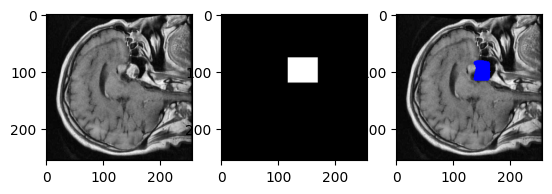

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1215_jpg.rf.39b9bf6d0755dedea7f7902ada3054dd.jpg are : 107
Pixel accuracy score is : 0.9893
Area of image is : 65536 units and area of predicted mask is : 562.5 units.


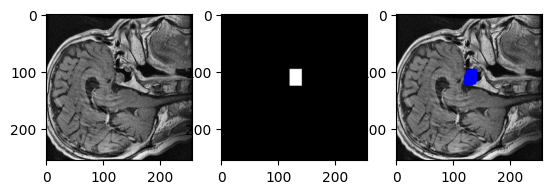

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1219_jpg.rf.5aa43489f3d5f394e707395b2ab56993.jpg are : 169
Pixel accuracy score is : 0.9724
Area of image is : 65536 units and area of predicted mask is : 1288.5 units.


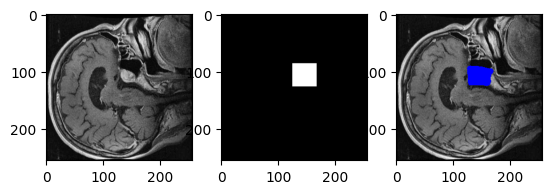

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1222_jpg.rf.3b812ba8a3a84d99e8c0aebcc4104425.jpg are : 286
Pixel accuracy score is : 0.9546
Area of image is : 65536 units and area of predicted mask is : 2104.0 units.


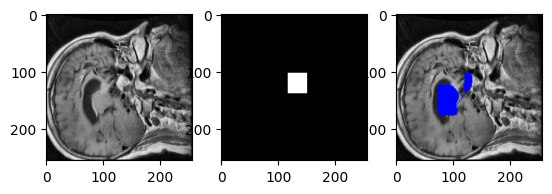

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1234_jpg.rf.38422a8518c33ca609f223d0d4115f0d.jpg are : 15
Pixel accuracy score is : 0.9838
Area of image is : 65536 units and area of predicted mask is : 6.5 units.


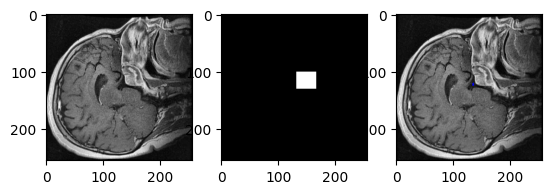

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1237_jpg.rf.5dc3a6884c4c1ed0bd2234f9f2952db9.jpg are : 103
Pixel accuracy score is : 0.9827
Area of image is : 65536 units and area of predicted mask is : 491.5 units.


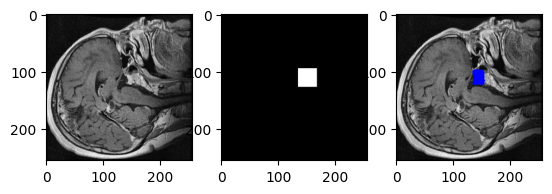

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1239_jpg.rf.25df4bb62b5849db8394ad79e6b17985.jpg are : 117
Pixel accuracy score is : 0.9791
Area of image is : 65536 units and area of predicted mask is : 527.5 units.


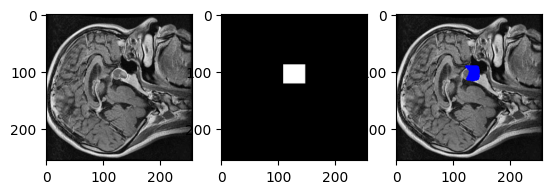

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1241_jpg.rf.50fcb2acf9805deae9b8838e1717903f.jpg are : 95
Pixel accuracy score is : 0.9697
Area of image is : 65536 units and area of predicted mask is : 367.5 units.


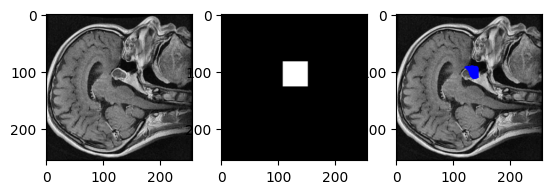

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1250_jpg.rf.7036744cfcee99ff5c239b9e5b608660.jpg are : 153
Pixel accuracy score is : 0.9792
Area of image is : 65536 units and area of predicted mask is : 1211.5 units.


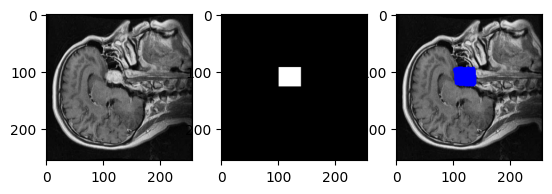

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1251_jpg.rf.ed6956a4e13c141365714c5a3911b592.jpg are : 102
Pixel accuracy score is : 0.9855
Area of image is : 65536 units and area of predicted mask is : 206.0 units.


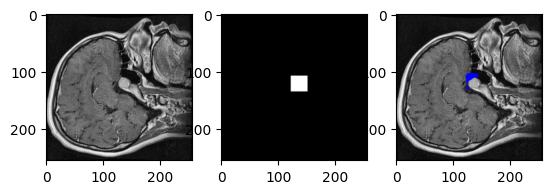

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1258_jpg.rf.47dda44eca3ffe34f82c22bdf5115c91.jpg are : 125
Pixel accuracy score is : 0.9862
Area of image is : 65536 units and area of predicted mask is : 826.5 units.


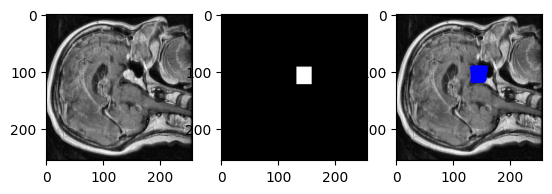

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1265_jpg.rf.c71cc229ebca34cad4a39e5be931e282.jpg are : 119
Pixel accuracy score is : 0.987
Area of image is : 65536 units and area of predicted mask is : 763.5 units.


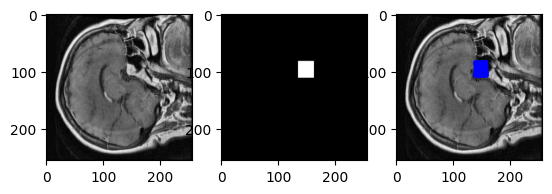

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1269_jpg.rf.9910a2b797a01f5f27e0af5c4f22316e.jpg are : 109
Pixel accuracy score is : 0.9895
Area of image is : 65536 units and area of predicted mask is : 657.5 units.


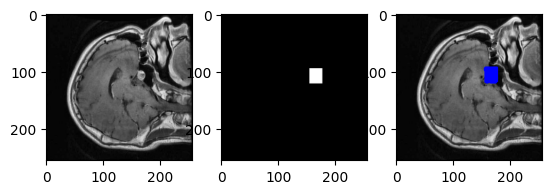

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1275_jpg.rf.d93b1c5f02ab192b12c918ee93ff5dc3.jpg are : 139
Pixel accuracy score is : 0.9793
Area of image is : 65536 units and area of predicted mask is : 1038.5 units.


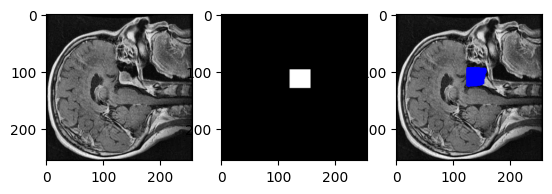

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1276_jpg.rf.ae52101143bf5e0b1ed92ade8c16679f.jpg are : 179
Pixel accuracy score is : 0.9633
Area of image is : 65536 units and area of predicted mask is : 1714.5 units.


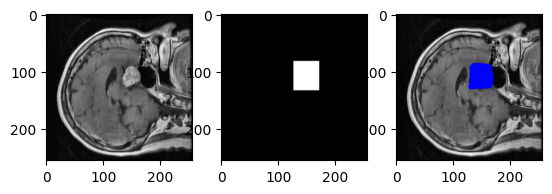

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 128_jpg.rf.ae9c1ccd37266ebb6f9e304dbc072d29.jpg are : 176
Pixel accuracy score is : 0.9395
Area of image is : 65536 units and area of predicted mask is : 402.0 units.


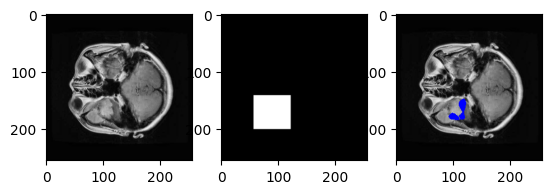

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 129_jpg.rf.8ed3abc795fc4a664753d64c5cc5b8a7.jpg are : 161
Pixel accuracy score is : 0.9641
Area of image is : 65536 units and area of predicted mask is : 1266.5 units.


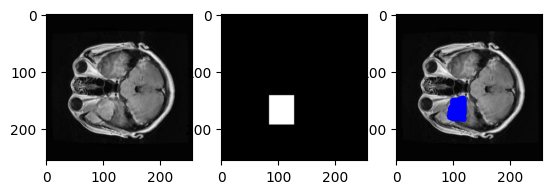

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1308_jpg.rf.5dfa6eaf7fbd7f25726601b80ad3e924.jpg are : 147
Pixel accuracy score is : 0.9839
Area of image is : 65536 units and area of predicted mask is : 660.5 units.


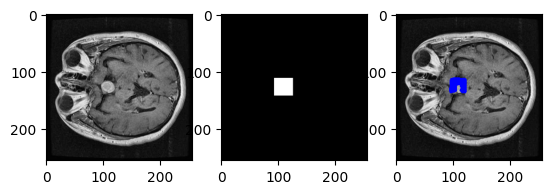

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 130_jpg.rf.c3eff224e890e8285262ecce131b306c.jpg are : 55
Pixel accuracy score is : 0.9389
Area of image is : 65536 units and area of predicted mask is : 120.5 units.


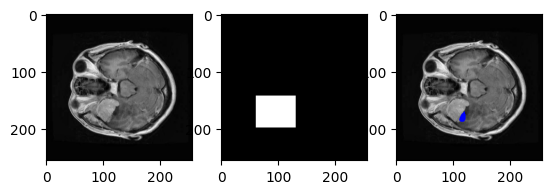

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1328_jpg.rf.c3f91c42c82b45c4a1904530fb687bbf.jpg are : 185
Pixel accuracy score is : 0.9789
Area of image is : 65536 units and area of predicted mask is : 467.5 units.


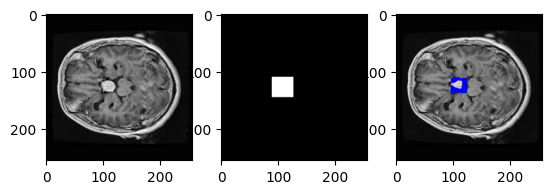

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 132_jpg.rf.16d894ca3458e53b1ab42b3e639857ab.jpg are : 185
Pixel accuracy score is : 0.9612
Area of image is : 65536 units and area of predicted mask is : 1565.5 units.


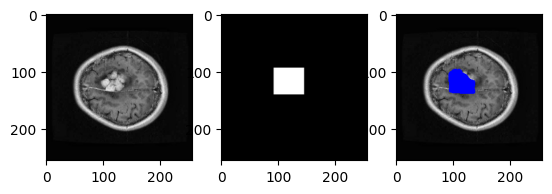

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1333_jpg.rf.4fee0c6d3a344f601218e6034b87c3bc.jpg are : 119
Pixel accuracy score is : 0.9836
Area of image is : 65536 units and area of predicted mask is : 719.5 units.


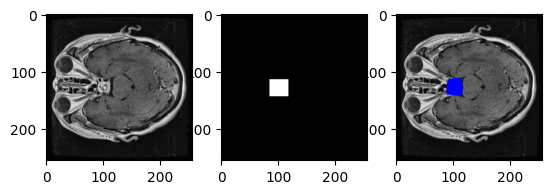

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1334_jpg.rf.74cb61c3d86524d7bb4e9d05e13c6722.jpg are : 107
Pixel accuracy score is : 0.9822
Area of image is : 65536 units and area of predicted mask is : 420.5 units.


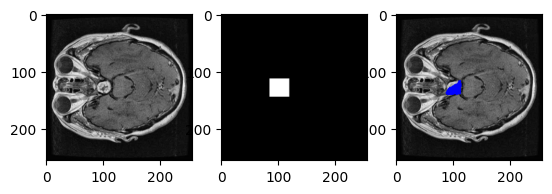

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1337_jpg.rf.eca2a25698dbc9a91222b695607a6f0a.jpg are : 79
Pixel accuracy score is : 0.9852
Area of image is : 65536 units and area of predicted mask is : 224.5 units.


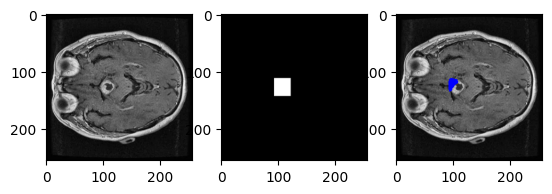

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1341_jpg.rf.c549bea8f488b4c02da3d56673852e13.jpg are : 145
Pixel accuracy score is : 0.9739
Area of image is : 65536 units and area of predicted mask is : 1072.5 units.


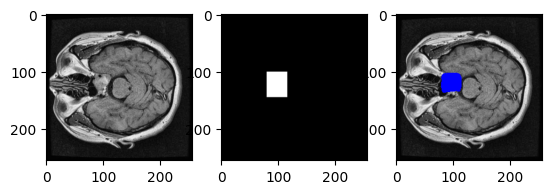

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1345_jpg.rf.54fa804d2c5aa5ee150120987469bc56.jpg are : 73
Pixel accuracy score is : 0.98
Area of image is : 65536 units and area of predicted mask is : 169.5 units.


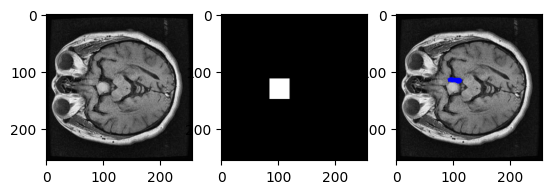

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1354_jpg.rf.4a078d462ede36068739118b2d968a1f.jpg are : 201
Pixel accuracy score is : 0.9553
Area of image is : 65536 units and area of predicted mask is : 2094.5 units.


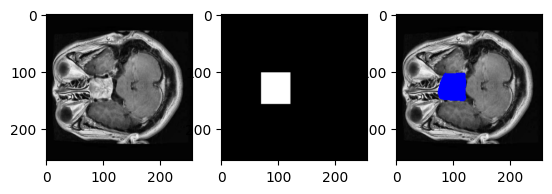

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1358_jpg.rf.28166eb29d15b22551634a4ef483d06a.jpg are : 227
Pixel accuracy score is : 0.9558
Area of image is : 65536 units and area of predicted mask is : 2832.5 units.


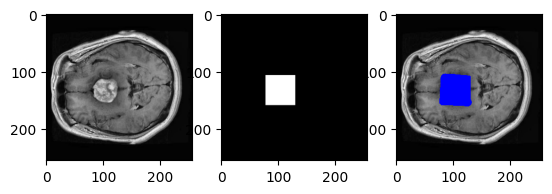

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1361_jpg.rf.d77d067dfc6aa94df76a98a34bea8ed5.jpg are : 141
Pixel accuracy score is : 0.9717
Area of image is : 65536 units and area of predicted mask is : 870.5 units.


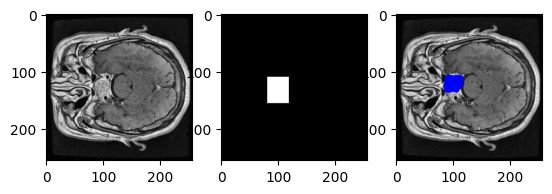

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1362_jpg.rf.68c70550a1438133f8a3126cc96e92c1.jpg are : 171
Pixel accuracy score is : 0.964
Area of image is : 65536 units and area of predicted mask is : 1466.5 units.


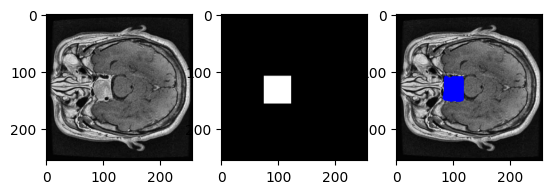

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1363_jpg.rf.01c4537b57f360820b9e00c7e0c99ae1.jpg are : 191
Pixel accuracy score is : 0.966
Area of image is : 65536 units and area of predicted mask is : 2013.5 units.


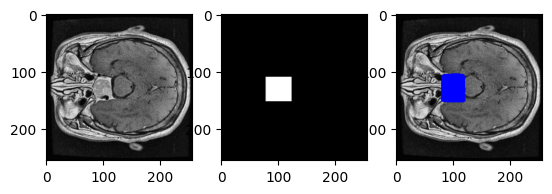

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1372_jpg.rf.baaa055c62427d02f393de45bfe27080.jpg are : 125
Pixel accuracy score is : 0.9812
Area of image is : 65536 units and area of predicted mask is : 747.5 units.


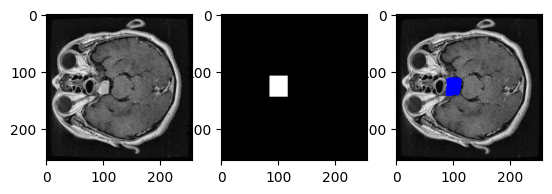

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 137_jpg.rf.43bbf189532c1e119bb835488cf0a3cd.jpg are : 185
Pixel accuracy score is : 0.9586
Area of image is : 65536 units and area of predicted mask is : 1508.5 units.


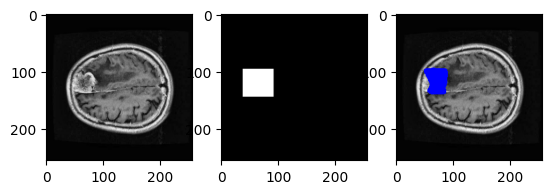

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1384_jpg.rf.eae9a65288f9807ec9f12cd953c54d7e.jpg are : 153
Pixel accuracy score is : 0.9819
Area of image is : 65536 units and area of predicted mask is : 1035.5 units.


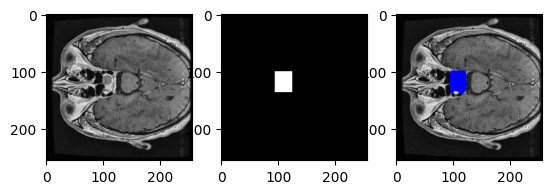

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1391_jpg.rf.e786fb6901f8cbf4f6349c5e2442d993.jpg are : 177
Pixel accuracy score is : 0.9742
Area of image is : 65536 units and area of predicted mask is : 1646.5 units.


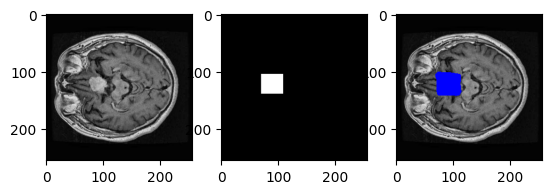

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1392_jpg.rf.0c4b6491f47be3bb48e21fda295dcca6.jpg are : 159
Pixel accuracy score is : 0.9777
Area of image is : 65536 units and area of predicted mask is : 1287.5 units.


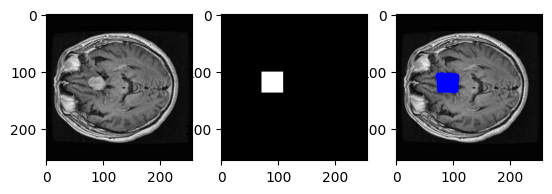

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1398_jpg.rf.f1539626aade61d853e0c56e28cbabc0.jpg are : 159
Pixel accuracy score is : 0.9658
Area of image is : 65536 units and area of predicted mask is : 1408.5 units.


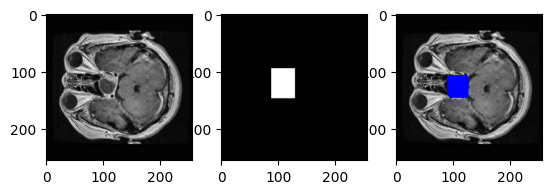

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1399_jpg.rf.f181f781289594b01f09c963eec9064e.jpg are : 153
Pixel accuracy score is : 0.9696
Area of image is : 65536 units and area of predicted mask is : 1310.5 units.


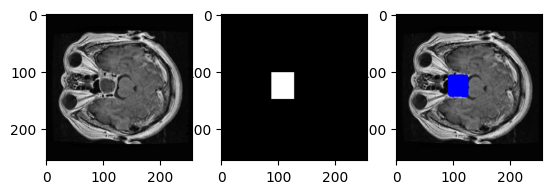

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1414_jpg.rf.c0e87ec0af2b747a03111abb2bd34134.jpg are : 151
Pixel accuracy score is : 0.9827
Area of image is : 65536 units and area of predicted mask is : 1106.5 units.


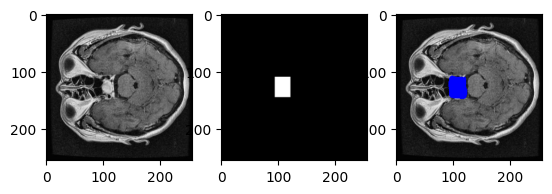

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1417_jpg.rf.e5f20469540da1612a58c40e7f8f0c5f.jpg are : 119
Pixel accuracy score is : 0.9875
Area of image is : 65536 units and area of predicted mask is : 766.5 units.


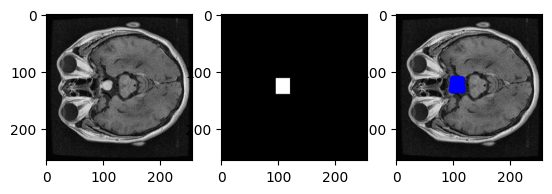

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1426_jpg.rf.35912ea40653b3bf85a096afe9f459aa.jpg are : 96
Pixel accuracy score is : 0.9792
Area of image is : 65536 units and area of predicted mask is : 284.0 units.


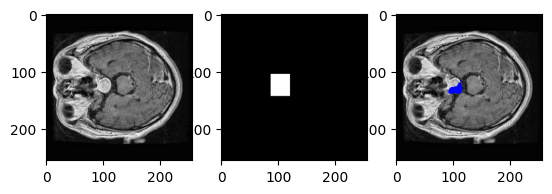

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 142_jpg.rf.6e227599721aa3921ac5bc0f57153f6f.jpg are : 82
Pixel accuracy score is : 0.9855
Area of image is : 65536 units and area of predicted mask is : 136.0 units.


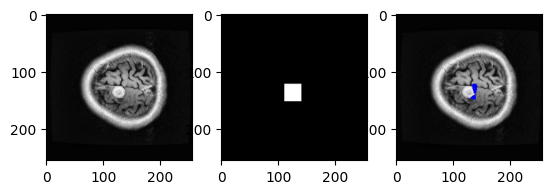

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1431_jpg.rf.cfed6ad02b698a9600f34264e0343c82.jpg are : 119
Pixel accuracy score is : 0.9839
Area of image is : 65536 units and area of predicted mask is : 647.5 units.


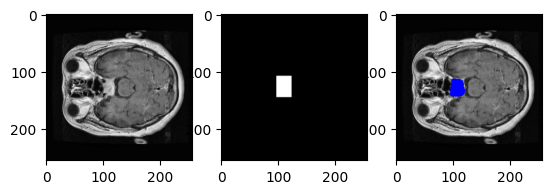

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1435_jpg.rf.dceabd909f8d893a6e83cf033745eea8.jpg are : 155
Pixel accuracy score is : 0.9645
Area of image is : 65536 units and area of predicted mask is : 1258.5 units.


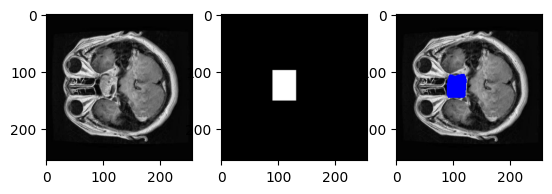

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1439_jpg.rf.9a551169be97b716b9a26e2aba6f68bd.jpg are : 185
Pixel accuracy score is : 0.9693
Area of image is : 65536 units and area of predicted mask is : 1823.5 units.


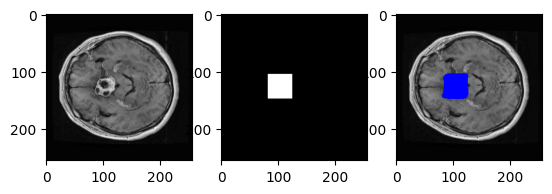

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1451_jpg.rf.176b70d4221fcedac41d532ff4871548.jpg are : 159
Pixel accuracy score is : 0.9792
Area of image is : 65536 units and area of predicted mask is : 1341.5 units.


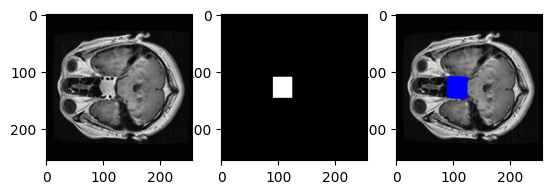

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1452_jpg.rf.2f5c15a03263501d81bf85269debcae7.jpg are : 139
Pixel accuracy score is : 0.9837
Area of image is : 65536 units and area of predicted mask is : 1042.5 units.


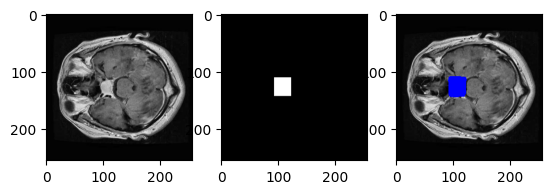

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1453_jpg.rf.49a8ae27294e8782f1a9846fe1f1b711.jpg are : 78
Pixel accuracy score is : 0.9865
Area of image is : 65536 units and area of predicted mask is : 106.0 units.


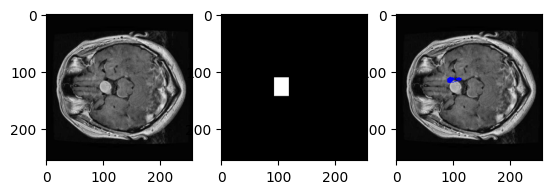

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1454_jpg.rf.e4e7a5ebbbe65681e75127fbd0f67735.jpg are : 123
Pixel accuracy score is : 0.9852
Area of image is : 65536 units and area of predicted mask is : 833.5 units.


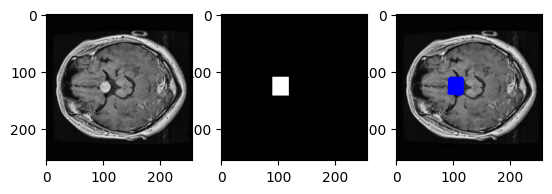

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1485_jpg.rf.1637bd85e0c3f27c9bc70f653341457f.jpg are : 125
Pixel accuracy score is : 0.9802
Area of image is : 65536 units and area of predicted mask is : 775.5 units.


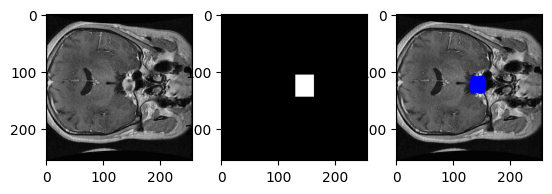

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1530_jpg.rf.9b5dbbfbc0c4cb2c68121ee95bb13f90.jpg are : 183
Pixel accuracy score is : 0.9704
Area of image is : 65536 units and area of predicted mask is : 1730.5 units.


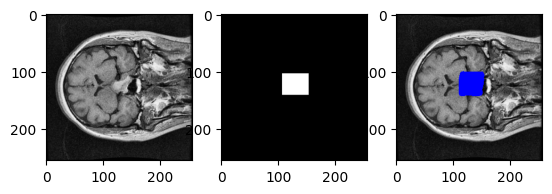

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1554_jpg.rf.9a0f20035dcab0601844d97bb46eb450.jpg are : 163
Pixel accuracy score is : 0.9739
Area of image is : 65536 units and area of predicted mask is : 1466.5 units.


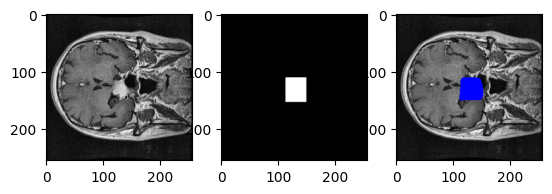

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1561_jpg.rf.8937b41aefb0978c5e88f288812f9f14.jpg are : 141
Pixel accuracy score is : 0.9791
Area of image is : 65536 units and area of predicted mask is : 1076.5 units.


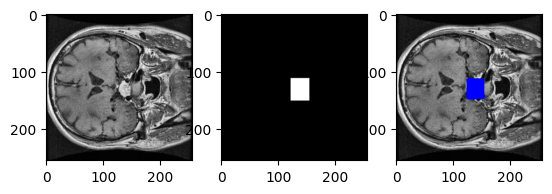

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1588_jpg.rf.9ec284b877c7898a5f99736b5741aad0.jpg are : 101
Pixel accuracy score is : 0.9586
Area of image is : 65536 units and area of predicted mask is : 467.5 units.


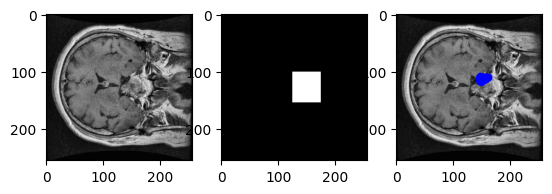

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 158_jpg.rf.43ffbf7b28796fda4d326005beaa8303.jpg are : 89
Pixel accuracy score is : 0.9235
Area of image is : 65536 units and area of predicted mask is : 265.5 units.


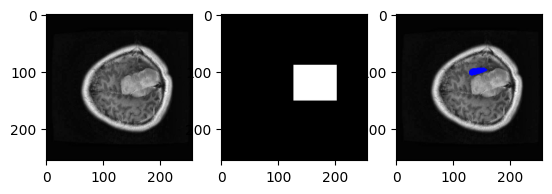

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1601_jpg.rf.aabbee7f3dc1601ea5254def6c36447e.jpg are : 187
Pixel accuracy score is : 0.9747
Area of image is : 65536 units and area of predicted mask is : 1155.5 units.


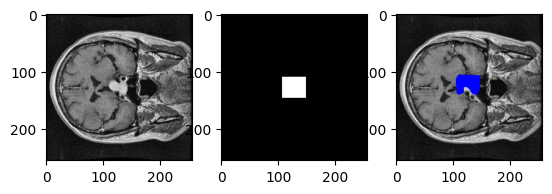

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1613_jpg.rf.9815b5234fe0b3af78db8393cc7180fe.jpg are : 167
Pixel accuracy score is : 0.9752
Area of image is : 65536 units and area of predicted mask is : 1511.5 units.


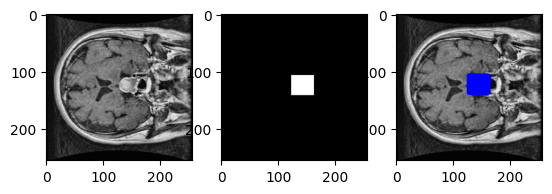

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1706_jpg.rf.004b87f63425ef145855aab826e33eee.jpg are : 143
Pixel accuracy score is : 0.9777
Area of image is : 65536 units and area of predicted mask is : 1163.5 units.


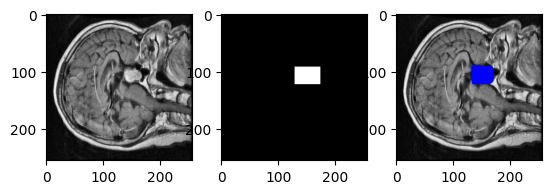

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1712_jpg.rf.ee4414b85047e5a8b830139e83dd27d2.jpg are : 157
Pixel accuracy score is : 0.9601
Area of image is : 65536 units and area of predicted mask is : 1135.5 units.


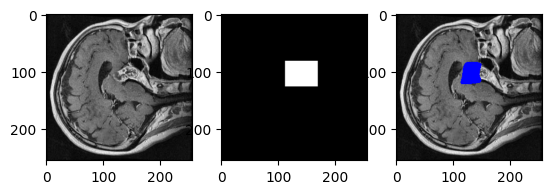

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1727_jpg.rf.bb87250fbe9b279286bf5e70c7218ae6.jpg are : 325
Pixel accuracy score is : 0.9064
Area of image is : 65536 units and area of predicted mask is : 5001.5 units.


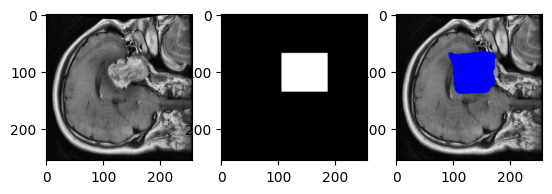

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1745_jpg.rf.c118db05947648ce4b97732328520a0d.jpg are : 85
Pixel accuracy score is : 0.9855
Area of image is : 65536 units and area of predicted mask is : 251.5 units.


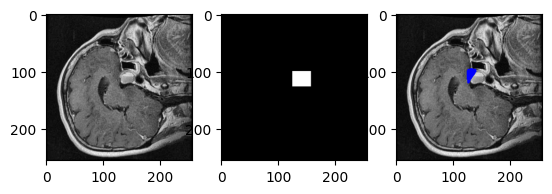

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1746_jpg.rf.85f4f468388849a1486979c92b68835e.jpg are : 153
Pixel accuracy score is : 0.9789
Area of image is : 65536 units and area of predicted mask is : 933.5 units.


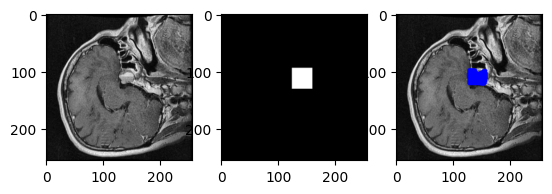

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1748_jpg.rf.c033e02f5c5aad0d0eda41c769f7a175.jpg are : 121
Pixel accuracy score is : 0.9888
Area of image is : 65536 units and area of predicted mask is : 722.5 units.


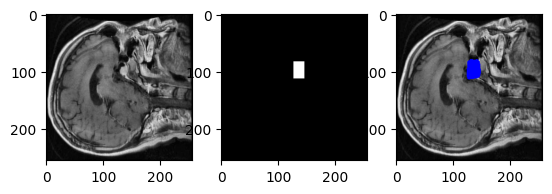

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1749_jpg.rf.3ee891e1d81edec0046da2806d1f2878.jpg are : 135
Pixel accuracy score is : 0.9831
Area of image is : 65536 units and area of predicted mask is : 923.5 units.


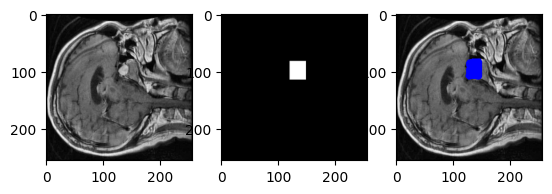

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1762_jpg.rf.eaf2a7a25720aca60dc5365ac8e53978.jpg are : 127
Pixel accuracy score is : 0.9865
Area of image is : 65536 units and area of predicted mask is : 876.5 units.


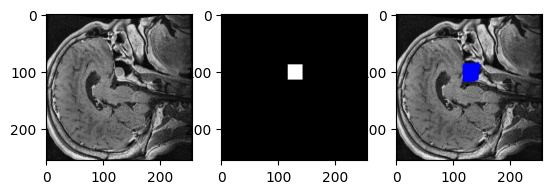

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1770_jpg.rf.c405d40faafee1bd9e29f5636df7aa88.jpg are : 181
Pixel accuracy score is : 0.9674
Area of image is : 65536 units and area of predicted mask is : 1719.5 units.


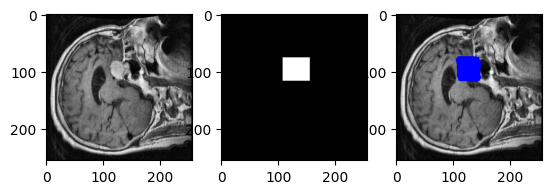

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1807_jpg.rf.9305cf992dcc56abc8097ba224009db3.jpg are : 159
Pixel accuracy score is : 0.979
Area of image is : 65536 units and area of predicted mask is : 1352.5 units.


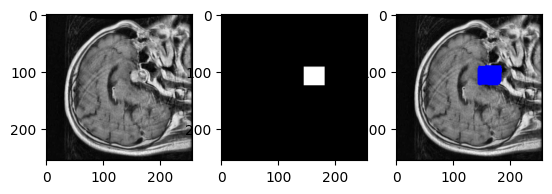

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 180_jpg.rf.8fcc2c29568483b33ff769d2e1fe89ff.jpg are : 201
Pixel accuracy score is : 0.963
Area of image is : 65536 units and area of predicted mask is : 2220.5 units.


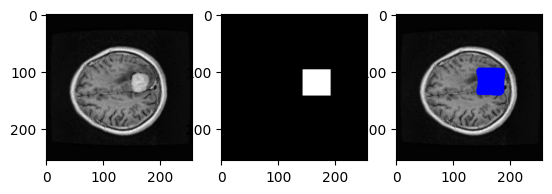

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1818_jpg.rf.8a4aaa9df3a3813cb1e4a105719177b8.jpg are : 151
Pixel accuracy score is : 0.9728
Area of image is : 65536 units and area of predicted mask is : 1248.5 units.


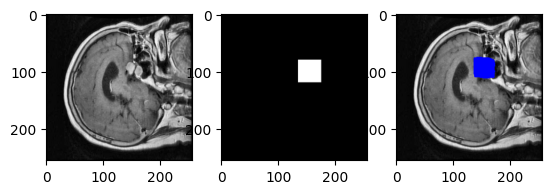

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1834_jpg.rf.c228106cb3160340cb5f9ef9bc1efee2.jpg are : 171
Pixel accuracy score is : 0.9765
Area of image is : 65536 units and area of predicted mask is : 1233.5 units.


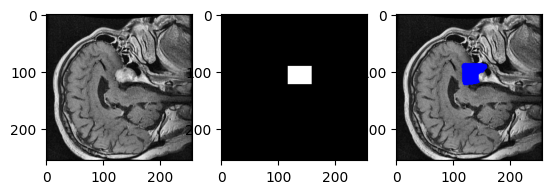

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1895_jpg.rf.3885f2c0ad67ee6023913df8948fbea7.jpg are : 183
Pixel accuracy score is : 0.9618
Area of image is : 65536 units and area of predicted mask is : 1758.5 units.


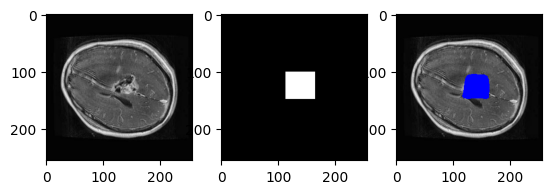

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1944_jpg.rf.a183808c61c221d374c949fe4ddffeff.jpg are : 146
Pixel accuracy score is : 0.9366
Area of image is : 65536 units and area of predicted mask is : 209.25 units.


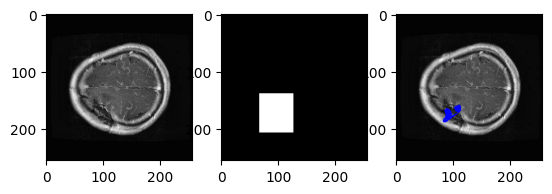

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1950_jpg.rf.6c230f4ba3b2a8c0639213288d1bba20.jpg are : 103
Pixel accuracy score is : 0.9863
Area of image is : 65536 units and area of predicted mask is : 382.5 units.


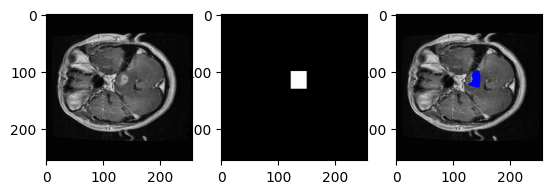

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1953_jpg.rf.930f3818be5f75b586ad1bc5e476fd8c.jpg are : 147
Pixel accuracy score is : 0.975
Area of image is : 65536 units and area of predicted mask is : 1172.5 units.


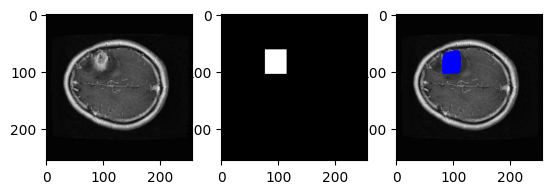

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1968_jpg.rf.394fdcc332b740c5b6860a5262051741.jpg are : 177
Pixel accuracy score is : 0.9611
Area of image is : 65536 units and area of predicted mask is : 1732.5 units.


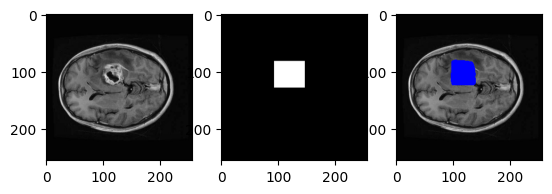

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1979_jpg.rf.67e32d7145a95e77e5f232bbf7cbd571.jpg are : 207
Pixel accuracy score is : 0.9522
Area of image is : 65536 units and area of predicted mask is : 1991.5 units.


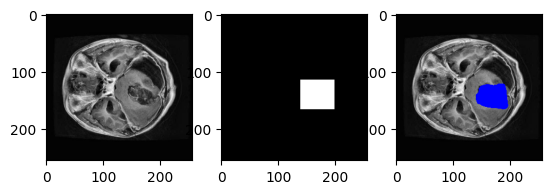

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 1999_jpg.rf.8b0b619f278d2b4be042b0522518b329.jpg are : 188
Pixel accuracy score is : 0.9604
Area of image is : 65536 units and area of predicted mask is : 447.0 units.


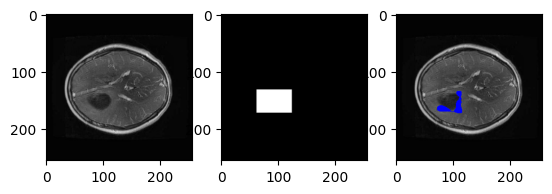

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2006_jpg.rf.6032bda2d2331ed507e1d037cd2ad57e.jpg are : 201
Pixel accuracy score is : 0.9492
Area of image is : 65536 units and area of predicted mask is : 2027.5 units.


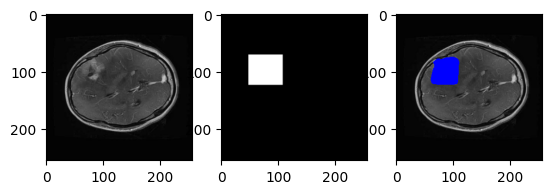

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2031_jpg.rf.c9619df57e145824eb7b223820de054c.jpg are : 206
Pixel accuracy score is : 0.9488
Area of image is : 65536 units and area of predicted mask is : 1770.0 units.


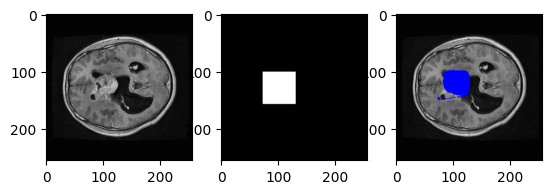

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2046_jpg.rf.4dc087895e6ce1dedcd7974707e88345.jpg are : 231
Pixel accuracy score is : 0.9355
Area of image is : 65536 units and area of predicted mask is : 2855.5 units.


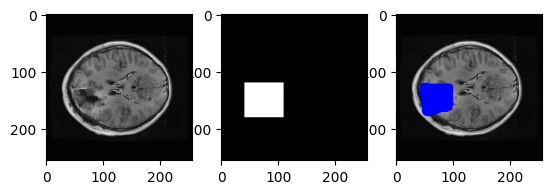

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2063_jpg.rf.ce8da6638ee52c021c783c3b4b9d8f17.jpg are : 189
Pixel accuracy score is : 0.9633
Area of image is : 65536 units and area of predicted mask is : 1797.5 units.


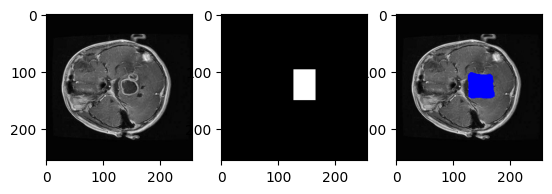

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2096_jpg.rf.45991f4399e1fe25c7458d6d97c29a5a.jpg are : 191
Pixel accuracy score is : 0.9348
Area of image is : 65536 units and area of predicted mask is : 1795.5 units.


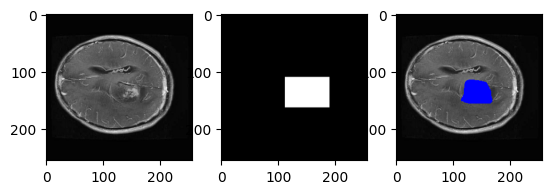

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2108_jpg.rf.e5b569ebbc1b11d3c22fd6858175f6d1.jpg are : 107
Pixel accuracy score is : 0.9267
Area of image is : 65536 units and area of predicted mask is : 261.5 units.


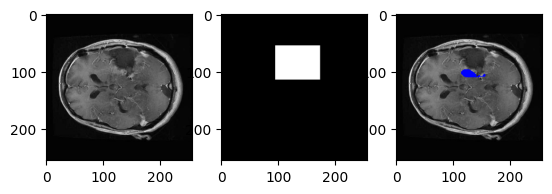

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2118_jpg.rf.eaae6ddcde0424cb795f7c386954102f.jpg are : 171
Pixel accuracy score is : 0.9774
Area of image is : 65536 units and area of predicted mask is : 1479.5 units.


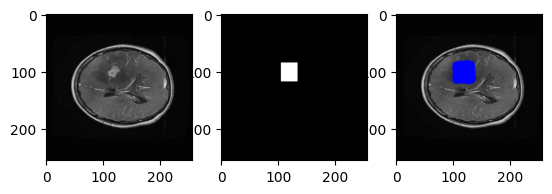

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2131_jpg.rf.bd46c8495f2b4691cbd0c05a8df979c6.jpg are : 219
Pixel accuracy score is : 0.9202
Area of image is : 65536 units and area of predicted mask is : 1825.5 units.


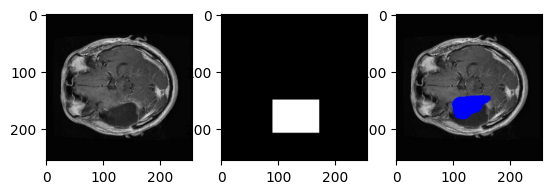

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 215_jpg.rf.8831964c43bb52bfce62d3a6d060f8e8.jpg are : 210
Pixel accuracy score is : 0.9392
Area of image is : 65536 units and area of predicted mask is : 1337.0 units.


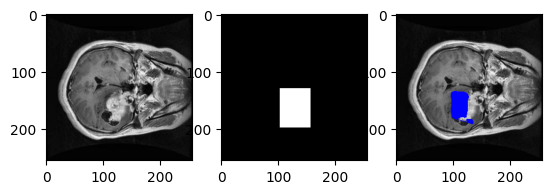

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2184_jpg.rf.7634feae1c37266b7039b936ea837a92.jpg are : 137
Pixel accuracy score is : 0.9375
Area of image is : 65536 units and area of predicted mask is : 821.5 units.


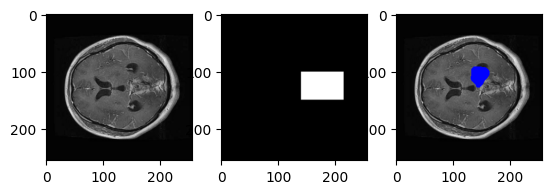

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2208_jpg.rf.c4830720047a4919677fe377d0e74816.jpg are : 169
Pixel accuracy score is : 0.9295
Area of image is : 65536 units and area of predicted mask is : 1166.5 units.


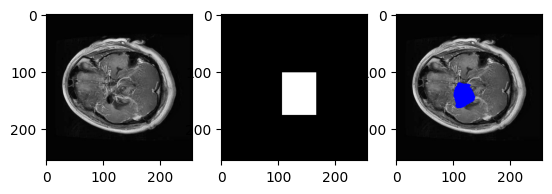

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2239_jpg.rf.b58906873dfb8fc784a624cb483b359a.jpg are : 139
Pixel accuracy score is : 0.9798
Area of image is : 65536 units and area of predicted mask is : 984.5 units.


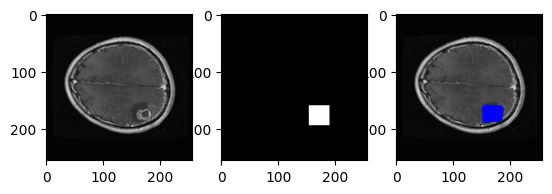

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2248_jpg.rf.4743cbde69cc89368ef43c803999a8df.jpg are : 85
Pixel accuracy score is : 0.9661
Area of image is : 65536 units and area of predicted mask is : 306.5 units.


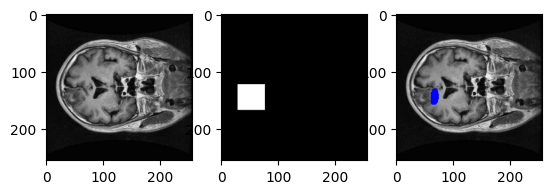

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2254_jpg.rf.cdca0cf717d9fe400aa22a95d3173431.jpg are : 247
Pixel accuracy score is : 0.9375
Area of image is : 65536 units and area of predicted mask is : 2978.5 units.


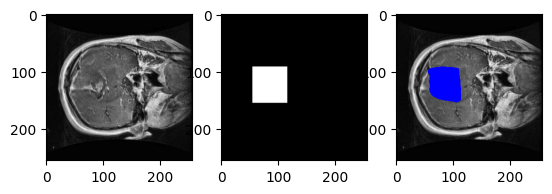

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2307_jpg.rf.cb1b16aabaf515ba78899a21a7e5eacc.jpg are : 167
Pixel accuracy score is : 0.9783
Area of image is : 65536 units and area of predicted mask is : 1397.5 units.


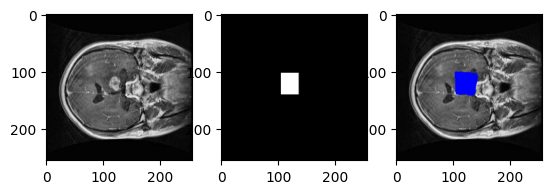

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2315_jpg.rf.1fe5b1e452cab7f25a9ef439a415d273.jpg are : 213
Pixel accuracy score is : 0.9615
Area of image is : 65536 units and area of predicted mask is : 2460.5 units.


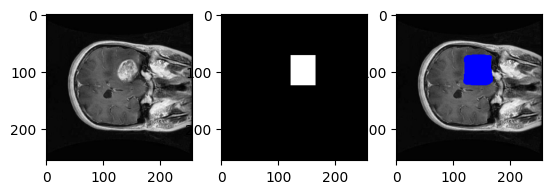

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2358_jpg.rf.261a8a680ae556103a09f2d097e8f600.jpg are : 285
Pixel accuracy score is : 0.9219
Area of image is : 65536 units and area of predicted mask is : 4226.5 units.


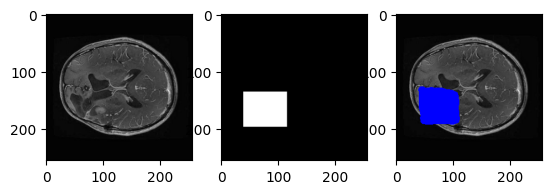

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 235_jpg.rf.7ee3011d051b3bfea2722c40cc36b52b.jpg are : 241
Pixel accuracy score is : 0.9369
Area of image is : 65536 units and area of predicted mask is : 3220.5 units.


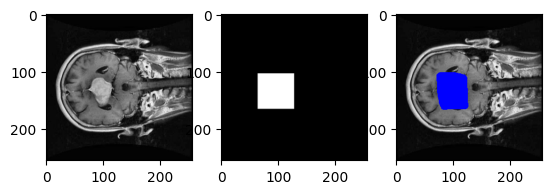

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2380_jpg.rf.e647ae28521abd373c0cd6e723cbdc5e.jpg are : 98
Pixel accuracy score is : 0.844
Area of image is : 65536 units and area of predicted mask is : 138.0 units.


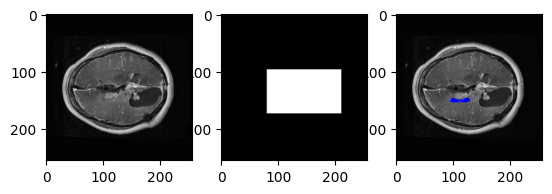

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2391_jpg.rf.3a2b2e32772205ae88315d69fa125f8c.jpg are : 169
Pixel accuracy score is : 0.921
Area of image is : 65536 units and area of predicted mask is : 1412.5 units.


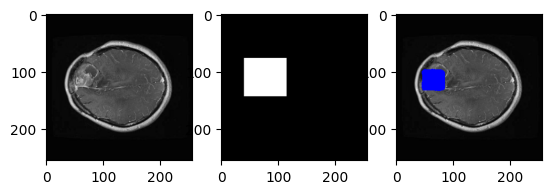

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2428_jpg.rf.b37719a353604e027ac6c39c73cb5c1d.jpg are : 171
Pixel accuracy score is : 0.9748
Area of image is : 65536 units and area of predicted mask is : 1517.5 units.


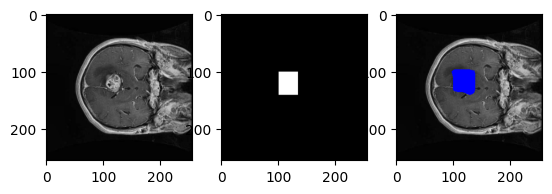

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2447_jpg.rf.2479876d1e173d14897371abb0020fa6.jpg are : 221
Pixel accuracy score is : 0.96
Area of image is : 65536 units and area of predicted mask is : 2492.5 units.


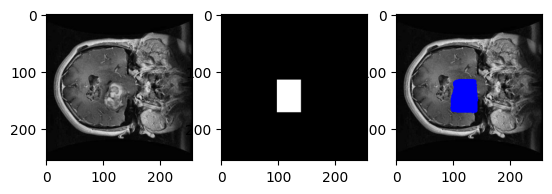

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 244_jpg.rf.65cbfcb7b085a1a1b55d83f611eb07f7.jpg are : 191
Pixel accuracy score is : 0.9725
Area of image is : 65536 units and area of predicted mask is : 1797.5 units.


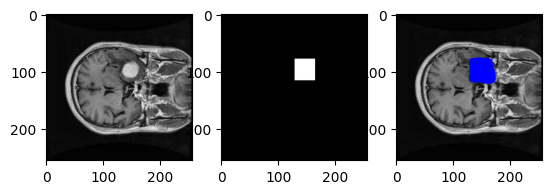

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2454_jpg.rf.b6bfce443bf914c5404fe7cd9c53e333.jpg are : 165
Pixel accuracy score is : 0.8974
Area of image is : 65536 units and area of predicted mask is : 1239.5 units.


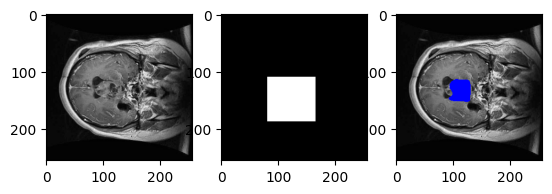

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2459_jpg.rf.a5ac75a27f22ecc27866b1ee432a19ab.jpg are : 215
Pixel accuracy score is : 0.8923
Area of image is : 65536 units and area of predicted mask is : 2411.5 units.


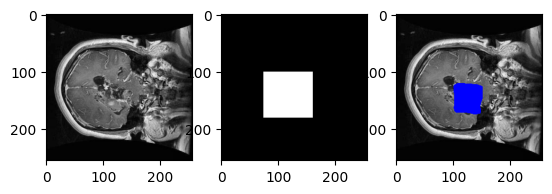

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2472_jpg.rf.48ba82acc8d4f817e9cf5d1c331855cc.jpg are : 217
Pixel accuracy score is : 0.9494
Area of image is : 65536 units and area of predicted mask is : 2321.5 units.


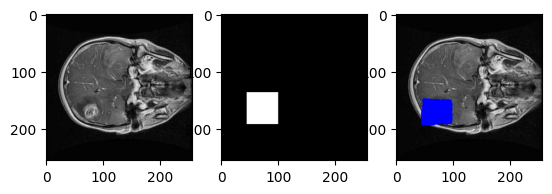

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2488_jpg.rf.41c10cfa57afe9f9487af3baa7e5af60.jpg are : 372
Pixel accuracy score is : 0.926
Area of image is : 65536 units and area of predicted mask is : 3882.0 units.


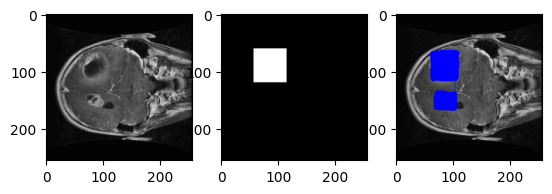

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2501_jpg.rf.c599f3506f0ae654b6fb43802927174d.jpg are : 243
Pixel accuracy score is : 0.9568
Area of image is : 65536 units and area of predicted mask is : 2874.5 units.


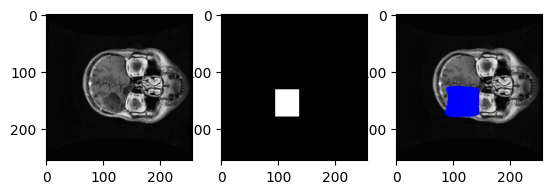

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2510_jpg.rf.2d1f46b0dd4b6e287d33a2aa0f4fd990.jpg are : 183
Pixel accuracy score is : 0.9522
Area of image is : 65536 units and area of predicted mask is : 1925.5 units.


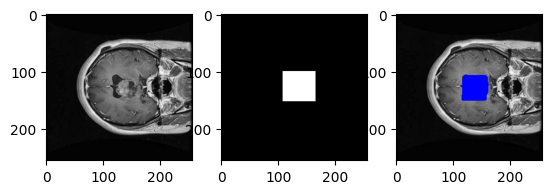

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2514_jpg.rf.635f5bd9944e763ed4c3e2556c6a266d.jpg are : 201
Pixel accuracy score is : 0.958
Area of image is : 65536 units and area of predicted mask is : 2207.5 units.


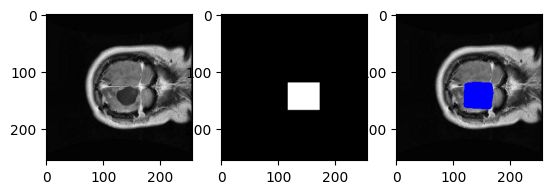

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2550_jpg.rf.e6c5742975680032695791dd9e8eaaff.jpg are : 69
Pixel accuracy score is : 0.9584
Area of image is : 65536 units and area of predicted mask is : 183.5 units.


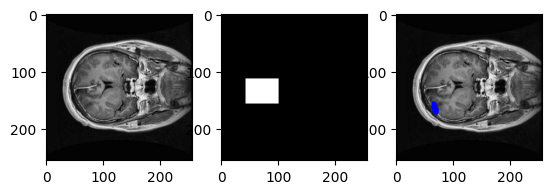

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2576_jpg.rf.af70fd469584cdf9a1d533f1649b5c6e.jpg are : 257
Pixel accuracy score is : 0.9334
Area of image is : 65536 units and area of predicted mask is : 3470.5 units.


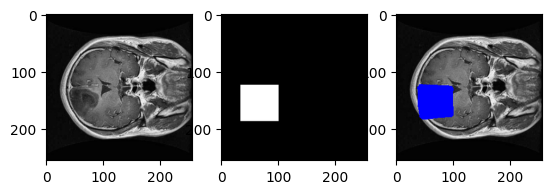

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2597_jpg.rf.6df05054649dc568b4e30b73916beeab.jpg are : 189
Pixel accuracy score is : 0.9693
Area of image is : 65536 units and area of predicted mask is : 1255.5 units.


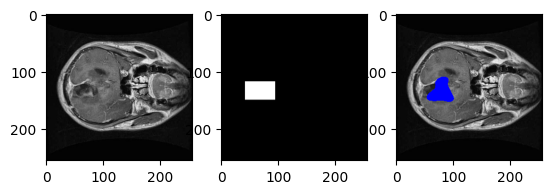

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2603_jpg.rf.5e3809e5081d5f1a7f30ba781331c4b2.jpg are : 90
Pixel accuracy score is : 0.9367
Area of image is : 65536 units and area of predicted mask is : 146.0 units.


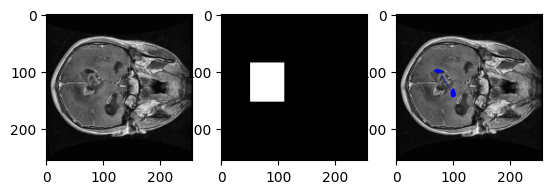

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 262_jpg.rf.e6710d897ae9cb78973d1f98e2847949.jpg are : 99
Pixel accuracy score is : 0.9522
Area of image is : 65536 units and area of predicted mask is : 278.5 units.


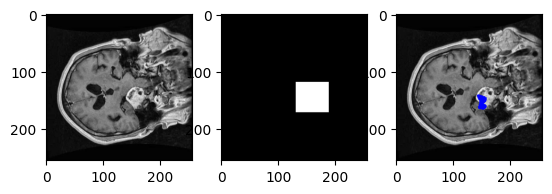

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2655_jpg.rf.1871903cc03ad2f30c75f9eed9a98fdc.jpg are : 175
Pixel accuracy score is : 0.9615
Area of image is : 65536 units and area of predicted mask is : 1461.5 units.


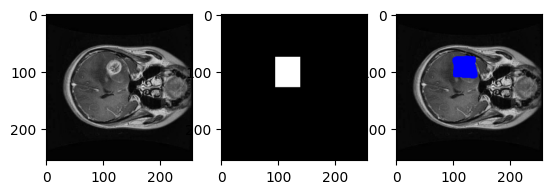

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2671_jpg.rf.c5357994c10cd7e7d90f4948750f8dec.jpg are : 261
Pixel accuracy score is : 0.9427
Area of image is : 65536 units and area of predicted mask is : 3314.5 units.


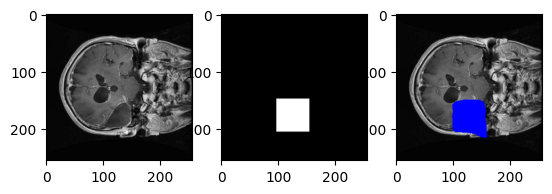

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2677_jpg.rf.70b2ff9e3724aa817a4ee9f01a8fd1f6.jpg are : 275
Pixel accuracy score is : 0.9278
Area of image is : 65536 units and area of predicted mask is : 3911.5 units.


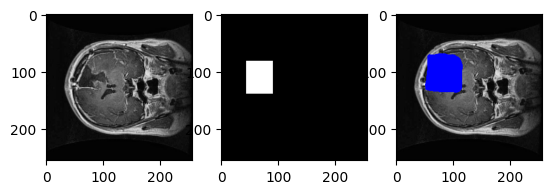

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2685_jpg.rf.542d6f86d76e8d9b2c2582135b9ae517.jpg are : 143
Pixel accuracy score is : 0.9845
Area of image is : 65536 units and area of predicted mask is : 969.5 units.


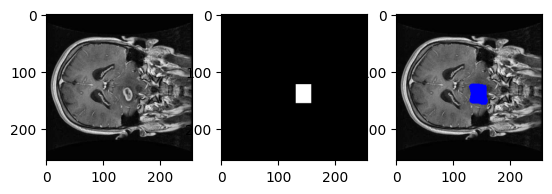

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2688_jpg.rf.87711f5327b1016473068ef4f85b98c2.jpg are : 230
Pixel accuracy score is : 0.9602
Area of image is : 65536 units and area of predicted mask is : 902.0 units.


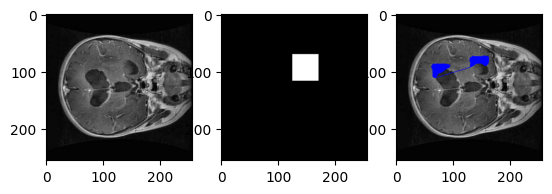

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 270_jpg.rf.dce1863f105dc58e5f463828b550d73d.jpg are : 193
Pixel accuracy score is : 0.9573
Area of image is : 65536 units and area of predicted mask is : 2009.5 units.


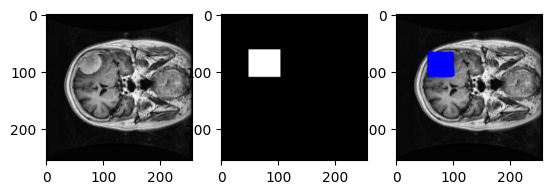

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2726_jpg.rf.c488735905855e1856d9400016ed3e58.jpg are : 317
Pixel accuracy score is : 0.9037
Area of image is : 65536 units and area of predicted mask is : 5520.5 units.


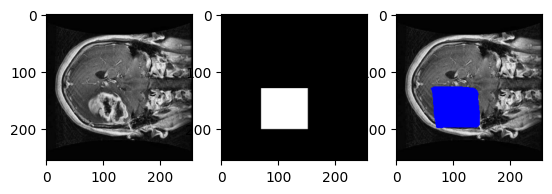

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2756_jpg.rf.4109c61d003fcaa96ff9bddcdb0c16b9.jpg are : 109
Pixel accuracy score is : 0.9874
Area of image is : 65536 units and area of predicted mask is : 647.5 units.


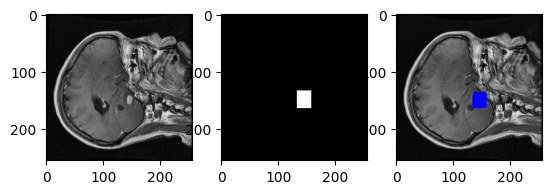

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2764_jpg.rf.0f9bd8866937dcf18593ed72cc68545d.jpg are : 305
Pixel accuracy score is : 0.8238
Area of image is : 65536 units and area of predicted mask is : 3508.5 units.


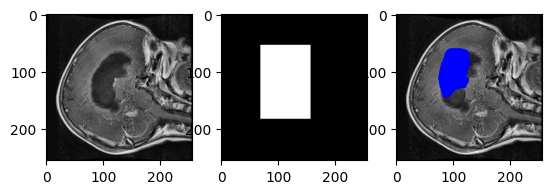

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2766_jpg.rf.c92010e2136dfc017e82fbaa23e24ae6.jpg are : 357
Pixel accuracy score is : 0.8841
Area of image is : 65536 units and area of predicted mask is : 6291.5 units.


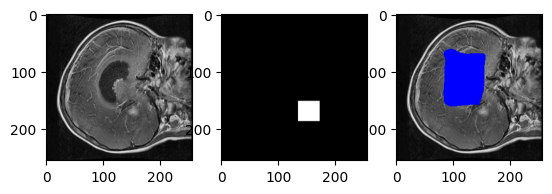

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 276_jpg.rf.964f4384fab418abd0fa7ecf62a0df20.jpg are : 235
Pixel accuracy score is : 0.945
Area of image is : 65536 units and area of predicted mask is : 3038.5 units.


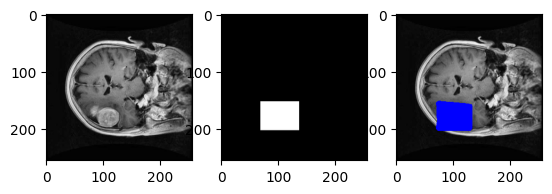

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2788_jpg.rf.2d54cf3446f3d578bc22b1db5978be21.jpg are : 183
Pixel accuracy score is : 0.8686
Area of image is : 65536 units and area of predicted mask is : 1606.5 units.


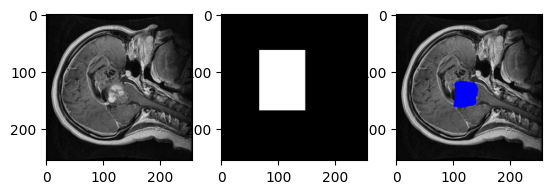

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 27_jpg.rf.b2a2b9811786cc32a23c46c560f04d07.jpg are : 125
Pixel accuracy score is : 0.9818
Area of image is : 65536 units and area of predicted mask is : 838.5 units.


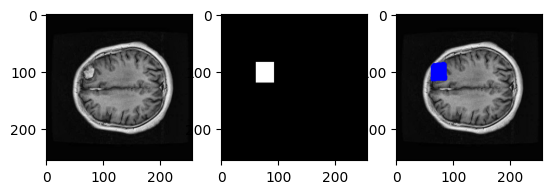

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2813_jpg.rf.94cf5ed8d9d4ddebacbddb8db78bfcfe.jpg are : 332
Pixel accuracy score is : 0.871
Area of image is : 65536 units and area of predicted mask is : 4431.0 units.


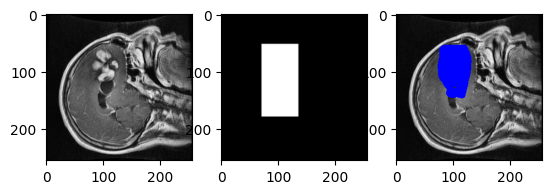

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2841_jpg.rf.376357d40f16b780c0042aa4c186554e.jpg are : 185
Pixel accuracy score is : 0.9187
Area of image is : 65536 units and area of predicted mask is : 1714.5 units.


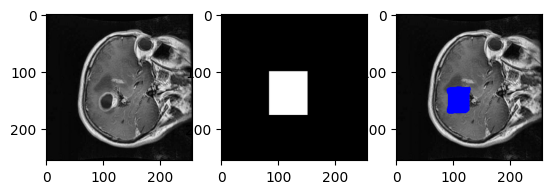

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2854_jpg.rf.a98ee31cc7aa5a26b69e58d15bd5e0ac.jpg are : 209
Pixel accuracy score is : 0.9658
Area of image is : 65536 units and area of predicted mask is : 1948.5 units.


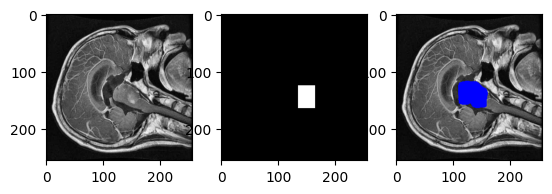

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2855_jpg.rf.f204accec3d14469ef471e86e35b863c.jpg are : 125
Pixel accuracy score is : 0.9798
Area of image is : 65536 units and area of predicted mask is : 606.5 units.


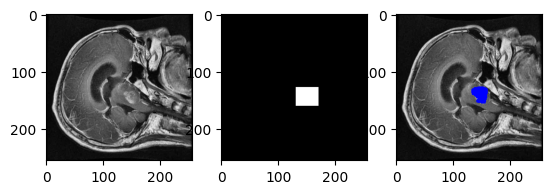

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2870_jpg.rf.1af7f1acd201ca7a33b459e1e99d893f.jpg are : 264
Pixel accuracy score is : 0.8903
Area of image is : 65536 units and area of predicted mask is : 2659.0 units.


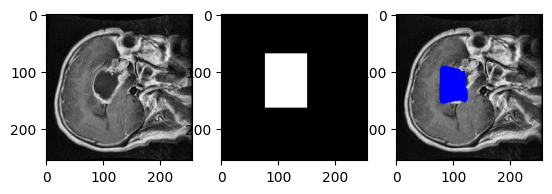

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2892_jpg.rf.1cbb5145b1cfc8be179291900e2be08d.jpg are : 195
Pixel accuracy score is : 0.9363
Area of image is : 65536 units and area of predicted mask is : 1885.5 units.


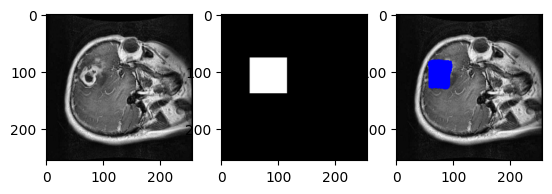

-----------------------------------------------------------------------------------
Number of predicted mask coordinates (Polygon Vertices) in image 2894_jpg.rf.7e7a643467368174db9ac12d8d428d48.jpg are : 207
Pixel accuracy score is : 0.8909
Area of image is : 65536 units and area of predicted mask is : 2075.5 units.


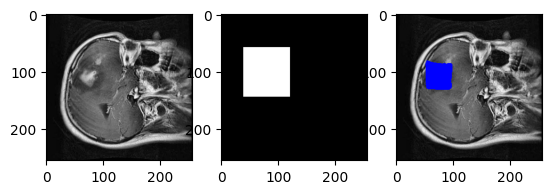

-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------
-----------------------------------------------------------------------------------

Average Pixel accuracy score in Testing is : 0.9616
Time taken is : 4.148 minutes.


In [34]:
# Testing model on test set and taking out predictions
t1= time.time()
total_pixel_accuracy_score= 0
n= 0
output_workbook= openpyxl.load_workbook(filename= os.path.join(os.getcwd(), "Training testing performance.xlsx"), read_only= False)
if "Predictions" in output_workbook.sheetnames:
    del output_workbook["Predictions"]
output_workbook.create_sheet(title= "Predictions", index= 1)
predictions_worksheet= output_workbook["Predictions"]
predictions_worksheet["A1"].value= "S. No."
predictions_worksheet["B1"].value= "Test image"
predictions_worksheet["C1"].value= "Target mask image"
predictions_worksheet["D1"].value= "Predicted mask image"
predictions_worksheet["E1"].value= "Pixel accuracy score"
predictions_worksheet["F1"].value= "Image area\n(units)"
predictions_worksheet["G1"].value= "Mask area\n(units)"
predictions_worksheet["H1"].value= "Mask coordinates list"

for img in os.listdir(os.path.join(os.getcwd(), "test_images")):
    image= cv2.imread(filename= os.path.join(os.getcwd(), "test_images", img))
    image= cv2.resize(src= image, dsize= (256, 256))
    # image= cv2.cvtColor(src= image, code= cv2.COLOR_RGB2GRAY)
    
    mask_image= cv2.imread(filename= os.path.join(os.getcwd(), "test_masks", img))
    mask_image= cv2.resize(src= mask_image, dsize= (256, 256))
    mask_image= cv2.cvtColor(src= mask_image, code= cv2.COLOR_RGB2GRAY)
    predicted_binary_masks = predict_binary_mask(os.path.join(os.getcwd(), "test_images", img))
    pixel_accuracy_score= calculate_pixel_accuracy(mask_image, predicted_binary_masks)
    mask_image= cv2.cvtColor(src= mask_image, code= cv2.COLOR_RGB2BGR)

    contours= skimage.measure.find_contours(image= predicted_binary_masks, level= None, fully_connected= "low", positive_orientation= "low", mask= None)
    polygon_vertices_list = []          # Convert contours to polygon vertices
    for contour in contours:
        contour = numpy.flip(contour, axis= 1)  # Convert (row, col) to (x, y)
        polygon_vertices_list.extend(contour.tolist())
    polygon_vertices= [[int(element[0]), int(element[1])] for element in polygon_vertices_list]
    polygon_vertices= numpy.array(polygon_vertices).reshape((-1, 1, 2))
    image_2= cv2.imread(filename= os.path.join(os.getcwd(), "test_images", img))
    image_2= cv2.resize(src= image_2, dsize= (256, 256))
    try:
        cv2.drawContours(image= image_2, contours= [polygon_vertices], contourIdx= -1, color= (255, 0, 0), thickness= cv2.FILLED)
        predicted_image= cv2.cvtColor(src= image_2, code= cv2.COLOR_RGB2BGR)
        cv2.imwrite(filename= os.path.join(os.getcwd(), "predicted_masks", img), img= image_2)
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.subplot(1, 3, 2)
        plt.imshow(mask_image)
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_image)
        print("Number of predicted mask coordinates (Polygon Vertices) in image", img, "are :", len(polygon_vertices_list))
        print("Pixel accuracy score is :", pixel_accuracy_score)
        total_pixel_accuracy_score += pixel_accuracy_score
        n= n+ 1
        polygon= shapely.geometry.Polygon(polygon_vertices_list)
        print("Area of image is :", (256* 256), "units and area of predicted mask is :", polygon.area, "units.")
        plt.show()


        predictions_worksheet.row_dimensions[n+ 1].height= 192
        predictions_worksheet["A"+ str(n+ 1)].value= n
        image = openpyxl.drawing.image.Image(img= os.path.join(os.getcwd(), "test_images", img))
        image.height = 256    # insert image height in pixels as float or int (e.g. 305.5)
        image.width= 256    # insert image width in pixels as float or int (e.g. 405.8)
        predictions_worksheet.add_image(img= image, anchor= "B" + str(n+ 1))    # where you want image to be anchored/start from
        predictions_worksheet.column_dimensions["B"].width= 36
        image = openpyxl.drawing.image.Image(img= os.path.join(os.getcwd(), "test_masks", img))
        image.height = 256
        image.width= 256
        predictions_worksheet.add_image(img= image, anchor= "C" + str(n+ 1))
        predictions_worksheet.column_dimensions["C"].width= 36
        image = openpyxl.drawing.image.Image(img= os.path.join(os.getcwd(), "predicted_masks", img))
        image.height = 256
        image.width= 256
        predictions_worksheet.add_image(img= image, anchor= "D" + str(n+ 1))
        predictions_worksheet.column_dimensions["D"].width= 36
        predictions_worksheet["E"+ str(n+ 1)].value= pixel_accuracy_score
        predictions_worksheet["F"+ str(n+ 1)].value= 256* 256
        predictions_worksheet["G"+ str(n+ 1)].value= polygon.area
        predictions_worksheet["H"+ str(n+ 1)].value= str(polygon_vertices_list)
    except Exception as error:
        # print("Prediction problem occured in image :", img)
        pass
    print("-----------------------------------------------------------------------------------")
print("\nAverage Pixel accuracy score in Testing is :", round((total_pixel_accuracy_score/ n), 4))
output_workbook.save(filename= os.path.join(os.getcwd(), "Training testing performance.xlsx"))
output_workbook.close()
t2= time.time()
print("Time taken is :", round((t2- t1)/ 60, 3), "minutes.")

In [43]:
print("Average Pixel accuracy score in Testing is :", round((total_pixel_accuracy_score/ n), 4))

Average Pixel accuracy score in Testing is : 0.9616


In [ ]:
image= cv2.imread(filename= os.path.join(os.getcwd(), "test_images", "1083_jpg.rf.b1473a76f8f3789c6be693dfbe9bc011.jpg"))
image= cv2.cvtColor(src= image, code= cv2.COLOR_BGR2GRAY)